# <b><div style='padding:25px;background-color:#9B2335;color:white;border-radius:4px;font-size:100%;text-align: center'>Singapore  Resale Flat Prices Prediction<br></div>

## <p style="color:Khaki;"> Importing required libraries</p>

In [53]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import pearsonr,kstest, norm, skew,kurtosis, boxcox
from statsmodels.formula.api import ols
import statsmodels.api as sm
import scipy.stats as stats
from wordcloud import WordCloud, STOPWORDS
from collections import Counter

sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)
sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})

---
title: "EDA Before Handling Outlier & Skewness"
author: "Santhoh Kumar"
format:
  html:
    toc: true
    html-math-method: katex
    css: styles.css
---


## <span style="color:Khaki;">Reading cleaned Dataset

In [3]:
df1=pd.read_feather('df1.feather')

In [4]:
df1.sample(10)

,month,town,flat_type,floor_area_sqm,flat_model,lease_commence_date,resale_price,floors,floor_no,year,full_address,price_per_sqm,remaining_lease_year
12853,5,Yishun,4 Room,92.0,New Generation,1985,237500.0,3,3,2000,737 Yishun St 72 Yishun,2581.521739,84
137123,1,Tampines,4 Room,93.0,Model A,2015,638000.0,3,12,2022,523C Tampines Ctrl 7 Tampines,6860.215054,92
67746,4,Tampines,3 Room,74.0,Model A,1984,120000.0,3,6,1994,263 Tampines St 21 Tampines,1621.621622,89
161918,10,Woodlands,5 Room,119.0,Improved,1996,275000.0,3,12,2004,706 Woodlands Dr 40 Woodlands,2310.924370,91
203399,7,Tampines,4 Room,105.0,Model A,1985,273000.0,3,3,1998,259 Tampines St 21 Tampines,2600.000000,86
99203,9,Pasir Ris,4 Room,108.0,Model A,1993,235000.0,3,9,2002,255 Pasir Ris St 21 Pasir Ris,2175.925926,90
46663,6,Yishun,Executive,142.0,Apartment,1988,233640.0,3,6,1993,387 Yishun Ring Rd Yishun,1645.352113,94
143353,12,Yishun,4 Room,92.0,Model A,2012,530000.0,3,9,2022,452 Yishun Ring Rd Yishun,5760.869565,89
8977,7,Bedok,3 Room,59.0,Improved,1976,346000.0,3,6,2012,1 Bedok Sth Ave 1 Bedok,5864.406780,63
195360,12,Bukit Merah,4 Room,87.0,Model A,2002,372000.0,3,15,2005,119B Kim Tian Rd Bukit Merah,4275.862069,96


## <span style="color:Khaki;">Defining variable type

In [5]:
continuous = ['floor_area_sqm', 'resale_price','price_per_sqm']

categorical = ['year','month' ,'town', 'flat_type','flat_model','lease_commence_date','floors','floor_no','remaining_lease_year']

## <p style="color:Khaki;"> Exploratory Data Analysis. Before Handling Skewness and Outliers</p>

<span style="color: Chartreuse;">   &#9784; &nbsp; <span style="color: DodgerBlue;font-size: 120%"> Defining a function for statistical information.</span></span><br>

In [6]:
def univar_num(df, col):
    plt.figure(figsize=(16, 8))
    df = df.dropna(subset=[col])


    mean=df[col].mean()
    median=df[col].median()
    mode=df[col].mode()[0]
    sns.set_style({'axes.facecolor': 'white','axes.edgecolor': 'white'})
    plt.subplot(2, 3, 1)
    sns.histplot(data=df, x=col, kde=True, bins=50,color='maroon',fill=True)
    plt.title(f'Histogram for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)

    
    plt.legend()
    plt.tight_layout()
    
    plt.subplot(2, 3, 2)
    sns.boxplot(data=df, x=col, color='lightgrey',legend=True)
    plt.xticks(rotation=45)
    plt.title(f'Box Plot for {col}')
    plt.axvline(mean, color='maroon', label='Mean')
    plt.axvline(median, color='black', label='Median')
    plt.axvline(mode, color='darkgreen', label='Mode')
    plt.legend()
    plt.tight_layout()

    
    plt.subplot(2, 3, 3)
    stats.probplot(df[col], dist="norm", plot=plt)
    plt.gca().get_lines()[1].set_color('maroon')
    plt.gca().get_lines()[0].set_color('darkgreen')
    plt.title(f'QQ Plot for {col}')

    plt.tight_layout()
    
    plt.tight_layout()
    plt.show()

In [7]:
def kurtosis_color(kurt_val):
    if -1 <= kurt_val <= 1:
        kurt_color = color_good  # Dark Green for near-zero kurtosis (good)
    elif 1 < kurt_val <= 3 or -3 <= kurt_val < -1:
        kurt_color = color_okay  # Yellow for moderate kurtosis
    else:  # kurt_val > 3 or kurt_val < -3
        kurt_color = color_bad  # Maroon for extreme kurtosis
    return kurt_color

def skewness_color(skew_val):
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
    return color

### <span style="color:Khaki;"> Numerical features Distribution

In [8]:
df1.describe().T

,count,mean,std,min,25%,50%,75%,max
floor_area_sqm,927465.0,95.691246,25.824986,28.000000,73.00000,93.000000,113.0,3.070000e+02
resale_price,927465.0,320848.058806,170522.857301,5000.000000,193000.00000,297500.000000,418000.0,1.588000e+06
floor_no,927465.0,8.697199,4.822093,3.000000,6.00000,9.000000,12.0,5.100000e+01
price_per_sqm,927465.0,3318.137732,1532.133749,161.290323,2292.26087,2956.521739,4200.0,1.559140e+04


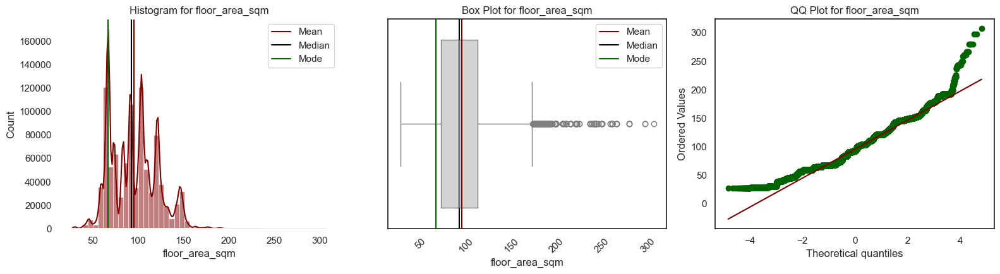



Skew for floor_area_sqm is 0.3661
Kurtosis for floor_area_sqm is -0.3464




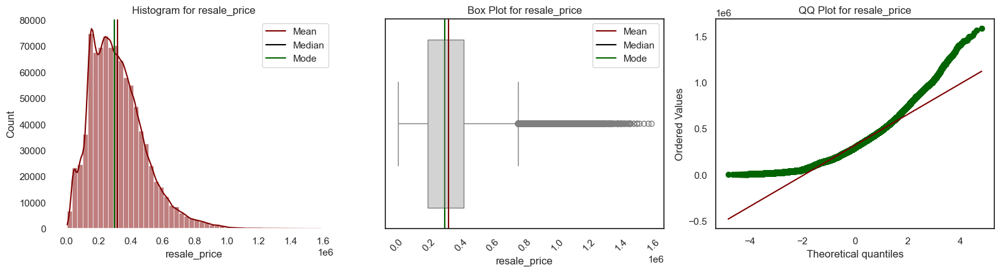



Skew for resale_price is 0.9422
Kurtosis for resale_price is 1.3735




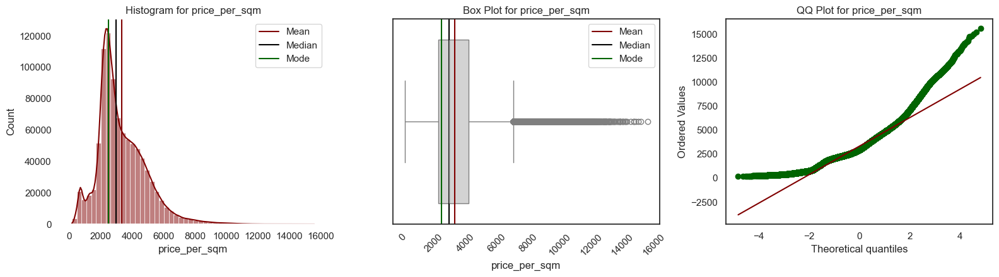



Skew for price_per_sqm is 1.0728
Kurtosis for price_per_sqm is 2.0849




In [9]:
color_good = '\033[32m'   # Dark Green for near-zero skew
color_okay = '\033[92m'   # Light Green for slightly positive or slightly negative skew
color_bad = '\033[91m'    # Maroon for significant skew
color_neutral = '\033[0m' # Reset color

skewed_col = []


for i in continuous:
    univar_num(df1,i) 
    skew_val = df1[i].skew()
    kurt=df1[i].kurtosis()
    kurt_color = kurtosis_color(kurt)
    color = skewness_color(skew_val)
    skewed_col.append(i)

    print(f"\n\n{color}Skew for {i} is {skew_val:.4f}{color_neutral}")
    print(f"{color}Kurtosis for {i} is {kurt:.4f}{color_neutral}\n\n")

<span style="color: Chartreuse;">   &#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <u>**Floor Area SQM - Observations**</u></span><br><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span> <span Style="color: white;font-size: 110%">The histogram indicates a right-skewed distribution. The higher mean (Right side than the median and mode), Skeness value of **0.3661**, the outliers on the upper whisker, the data point deviate on the QQ plot confirms the right skewed. </span><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span> <span Style="color: white;font-size: 110%"> The right skewness is also showing the presence of larger floor areas but in smaller quantities.</span><br>
<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span> <span Style="color: white;font-size: 110%">This negative kurtosis value **-0.3464** suggests that the distribution is slightly lighter tails compared to a normal distribution.</span> <br>
<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span> <span Style="color: white;font-size: 110%">Multiple peaks suggest possible sub-groups or clusters within the data.</span><br>
<span Style="color: DodgerBlue;font-size: 120%"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;</span> <span Style="color: white;font-size: 110%"> There are numerous outliers above 150 sqm, indicating a significant number of observations much larger than the bulk of the data.</span>

<span style="color: Chartreuse;">   &#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <u>**Resale Price - Observations**</u></span><br><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;  </span> <span Style="color: white;font-size: 110%">The histogram indicates a right-skewed distribution. The higher mean (Right side than the median and mode), Skeness value of **0.9422**, the outliers on the upper whisker, the data point deviate on the QQ plot confirms the heaby right skew. </span><br><span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span> <span Style="color: white;font-size: 110%">  There are noticeable peaks around 0.2 to 0.4 million, indicating common resale prices. The long right tail shows the presence of higher resale prices, though in smaller quantities.</span><br>
<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;  </span> <span Style="color: white;font-size: 110%"> This positive kurtosis value **1.3735** suggests that the distribution has heavier tails than a normal distribution.</span> <br>
<span Style="color: DodgerBlue;font-size: 120%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;  </span> <span Style="color: white;font-size: 110%">Multiple peaks suggest possible sub-groups or clusters within the data.</span><br>
<span Style="color: DodgerBlue;font-size: 120%"> &nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span> <span Style="color: white;font-size: 110%"> TNumerous outliers above 0.6 million indicate a significant number of higher resale prices.</span>

<span style="color: Chartreuse;font-size: 130%">&#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <b>We will not use Price per SQM for modeling but we just use it for detecting outliers and price variance.</b></span>

### <span style="color:Khaki;"> Normality, Skew, Kurtosis Test

In [37]:
continuous = ['floor_area_sqm', 'resale_price',]

for var in continuous:
    stat, p = kstest(df1[var], 'norm', args=(df1[var].mean(), df1[var].std()))
    print(f'K-S Test for {var}: Statistics={stat}, p={p}')
    if p > 0.05:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')


K-S Test for floor_area_sqm: Statistics=0.09941099273674198, p=0.0
floor_area_sqm does not look normally distributed.

K-S Test for resale_price: Statistics=0.059450367412785865, p=0.0
resale_price does not look normally distributed.



In [51]:
for var in continuous:
    skewness = skew(df1[var])
    kurt = kurtosis(df1[var])
    print(f'{var} - Skewness: {skewness}, Kurtosis: {kurt}')
    if abs(skewness) < 0.5 and abs(kurt) < 3:
        print(f'{var} looks normally distributed.\n')
    else:
        print(f'{var} does not look normally distributed.\n')

floor_area_sqm - Skewness: 0.3660709490993199, Kurtosis: -0.34641220087085633
floor_area_sqm looks normally distributed.

resale_price - Skewness: 0.9421620158728324, Kurtosis: 1.373502157753908
resale_price does not look normally distributed.



<span style="color: Chartreuse;font-size: 130%">&#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <b>Above is the another way of checking distribution and Skewness, it representing the same results.</b></span>

### <span style="color:Khaki;">Categorical features Distribution

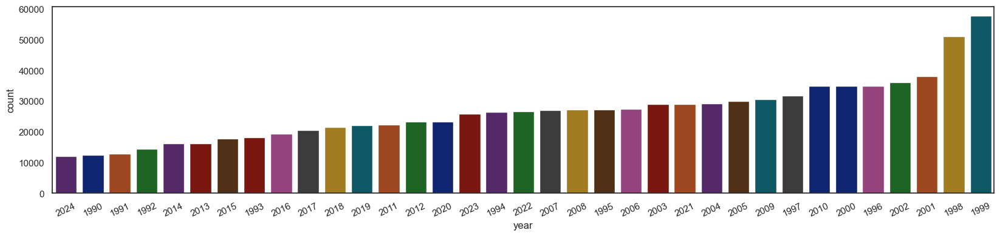

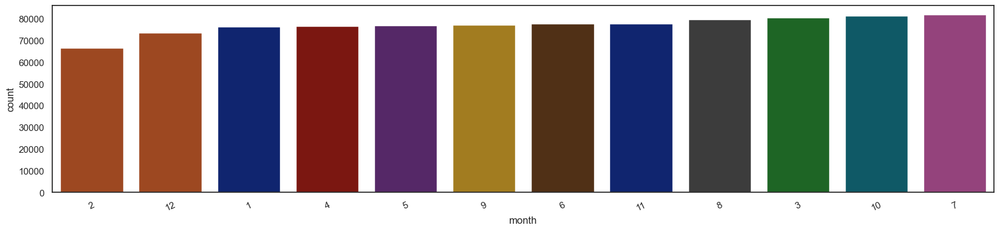

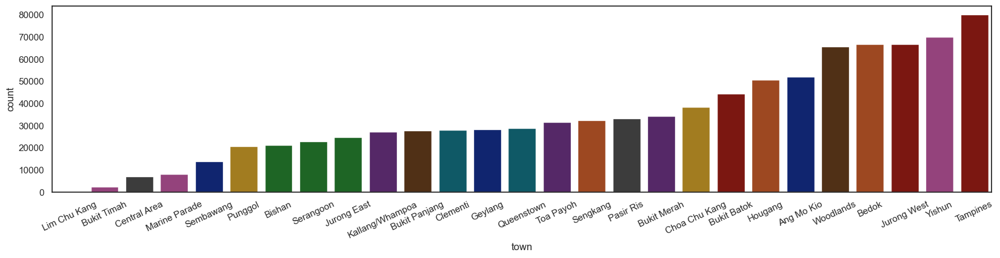

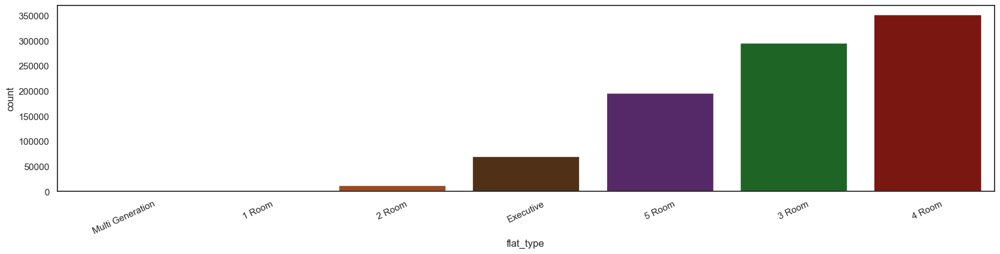

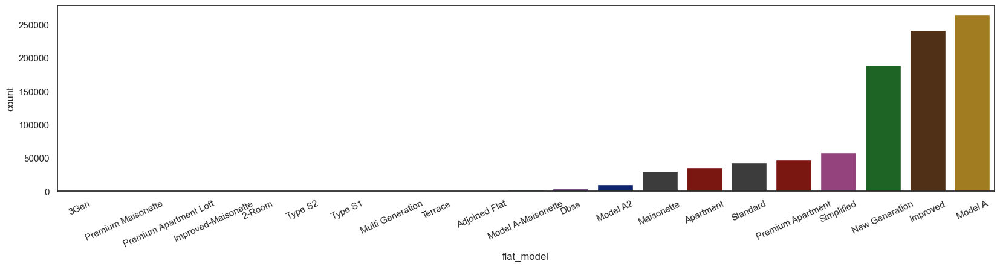

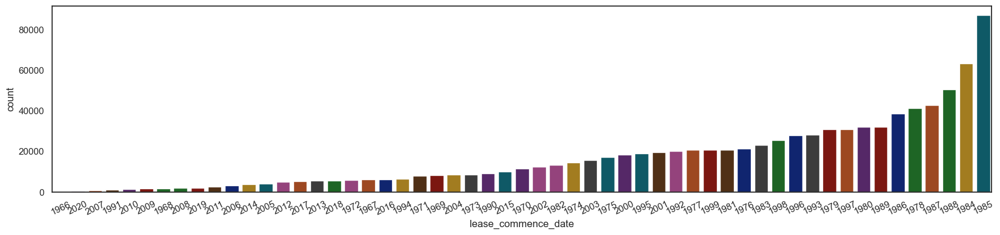

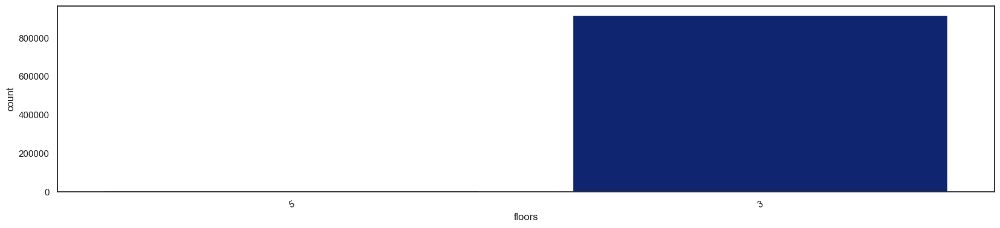

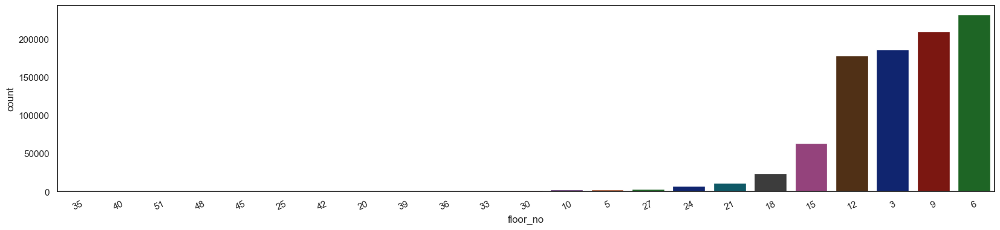

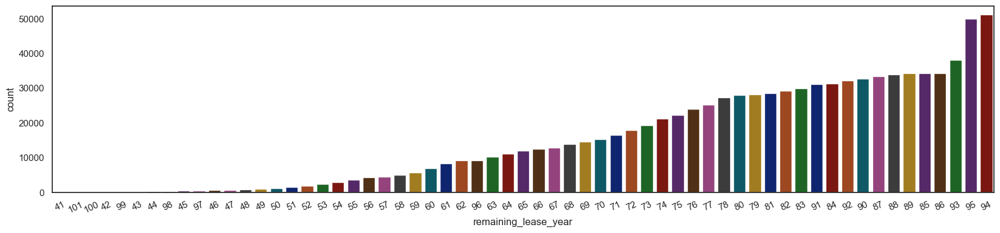

In [10]:
for i in categorical:
    plt.figure(figsize=(20, 4))
    sns.countplot(data=df1, x=df1[i], hue=i, order = df1[i].value_counts().index.tolist()[::-1],palette='dark',legend=False)
    plt.xticks(rotation=25)

<span style="color: Chartreuse;">   &#9784; &nbsp;</span> <span style="color: Tomato;font-size: 130%"> <u>**Observations:**</u></span><br><br> <span Style="color: DodgerBlue;font-size: 130%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;</span> <span style="color: Tomato;font-size: 120%"> <b>Year - </b> </span> 
<span style="color: white;font-size: 110%">The data spans from 1990 to 2023. Noticeable peaks in specific years, especially around 1999 and 2022.</span><br>

<span Style="color: DodgerBlue;font-size: 130%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Month - </b> </span><span style="color: white;font-size: 110%">The distribution across months is relatively uniform, with slightly differences in February and December.</span><br>

<span Style="color: DodgerBlue;font-size: 130%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Town - </b> </span><span style="color: white;font-size: 110%">The data includes various towns with significant differences in the count. Tampines, Jurong West, and Woodlands have the highest counts</span><br>

<span Style="color: DodgerBlue;font-size: 130%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span> <span style="color: Tomato;font-size: 120%"> <b>Flat Type - </b> </span><span style="color: white;font-size: 110%">Noticeable sales in 3 Room and 4 Room flats than the other flat type.</span><br>

<span Style="color: DodgerBlue;font-size: 130%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;</span> <span style="color: Tomato;font-size: 120%"> <b>Flat Model - </b> </span><span style="color: white;font-size: 110%"> The sales count of 62% flat models are extreamly low.24% flat models sales count are low. However, the New Generation, Improved, and Model A flats sales counts are extreanly high.</span><br>

<span Style="color: DodgerBlue;font-size: 130%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span><span style="color: Tomato;font-size: 100%"> <b>Floors - </b> </span><span style="color: white;font-size: 110%">99% flats are 3 floor flats.</span> <br>

<span Style="color: DodgerBlue;font-size: 130%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;</span> <span style="color: Tomato;font-size: 120%"> <b>Floor No - </b> </span> <span style="color: white;font-size: 110%">Most of the properties floor level are 6 followed by 9th floor, 3rd floor, and 12th floor. </span>

### <span style="color:Khaki;">Outliers based on the Categorical 

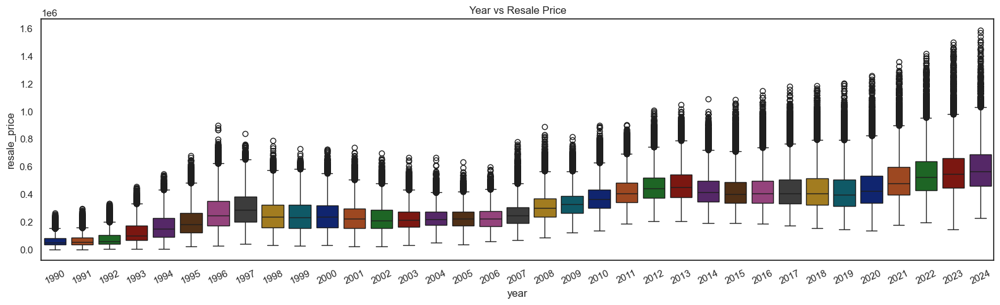

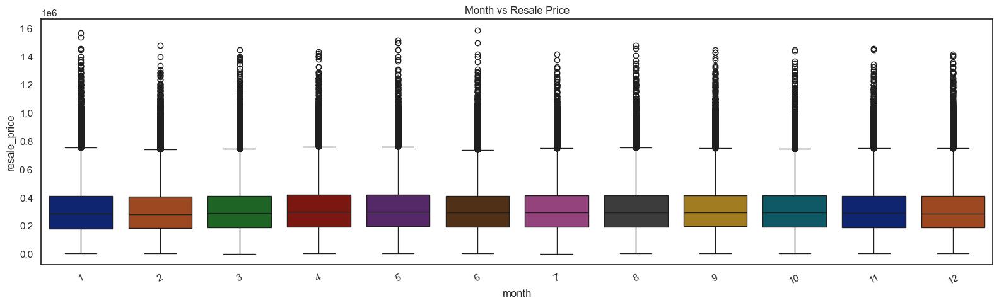

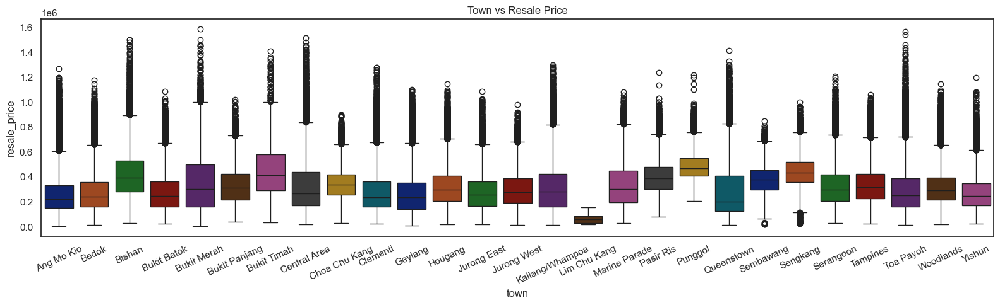

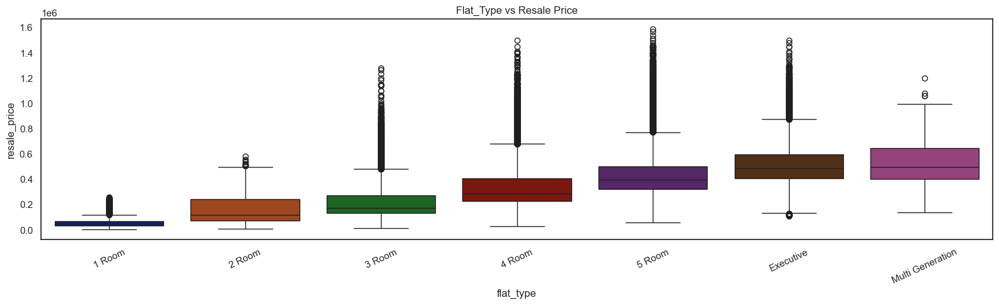

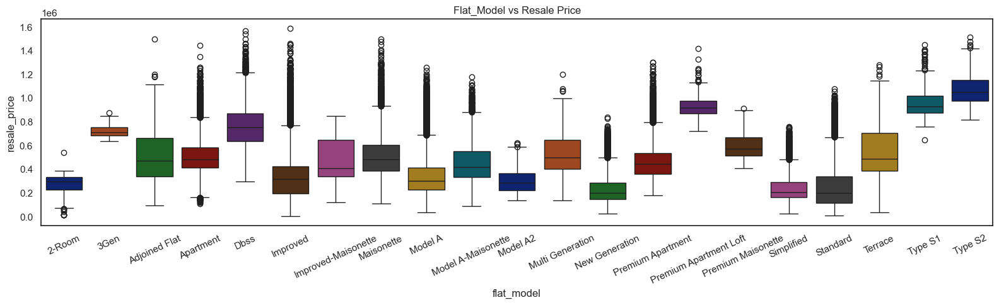

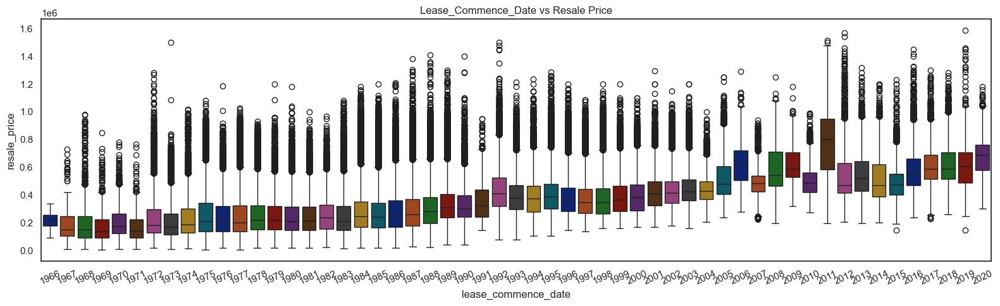

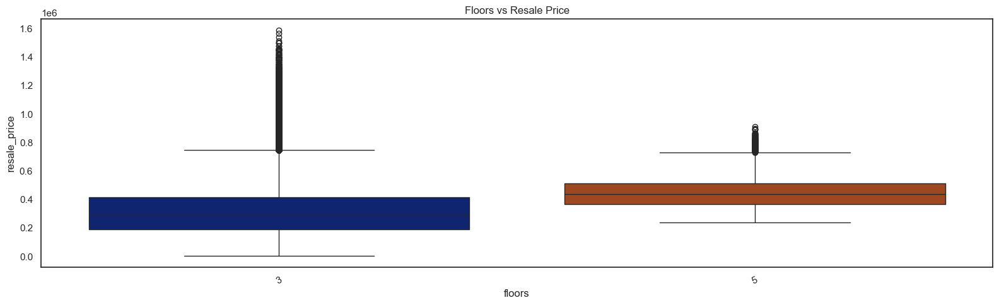

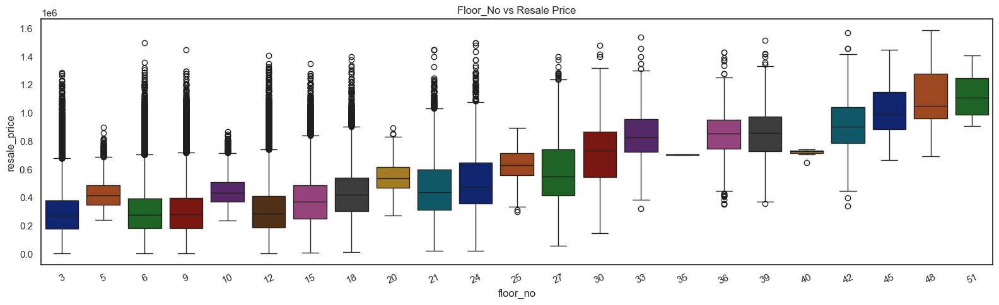

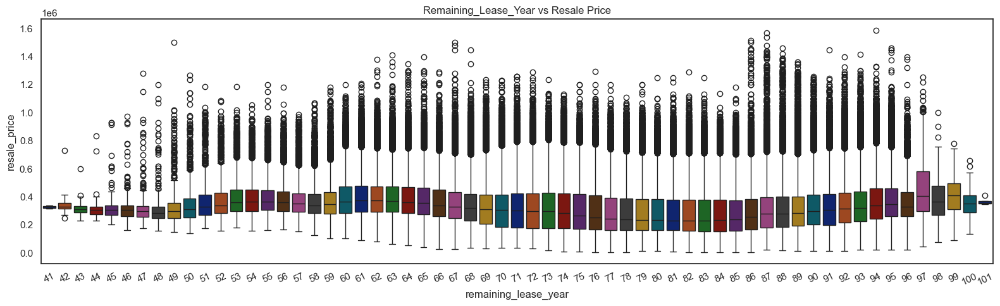

In [11]:
for i in categorical:
    plt.figure(figsize=(16,5))
    sns.boxplot(data=df1,x=i,y="resale_price",hue=i,palette='dark',legend=False)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Resale Price')
    plt.tight_layout()
    plt.show()

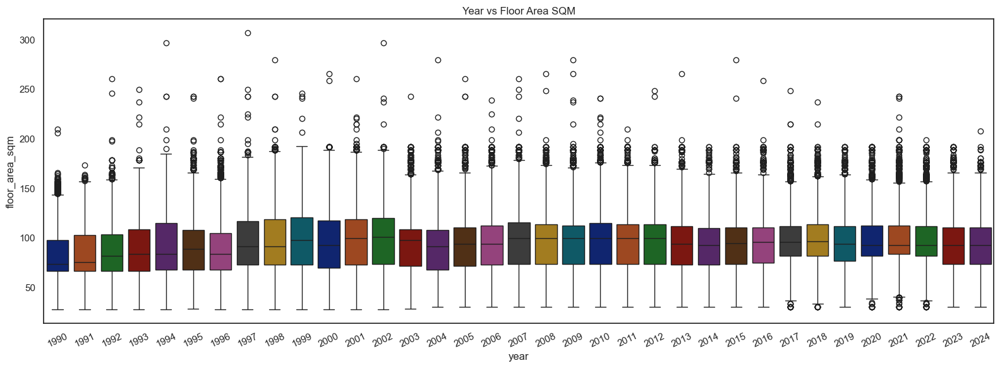

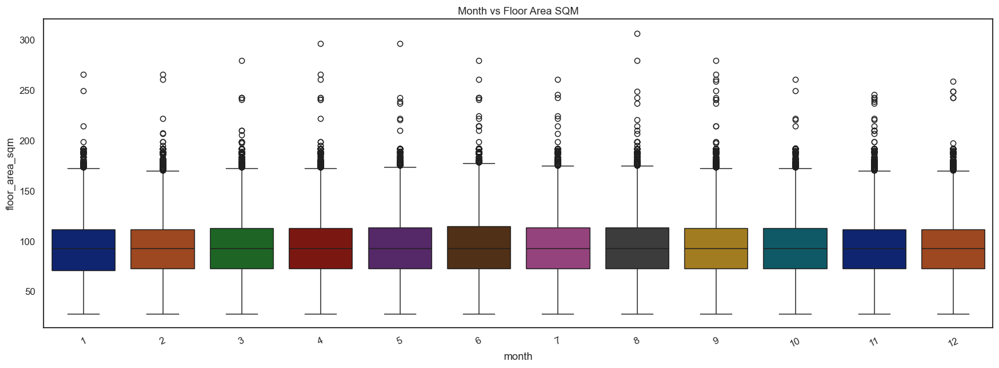

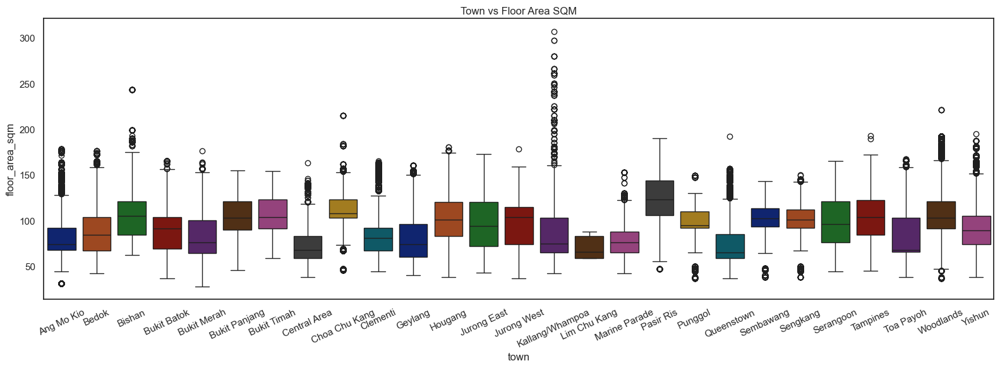

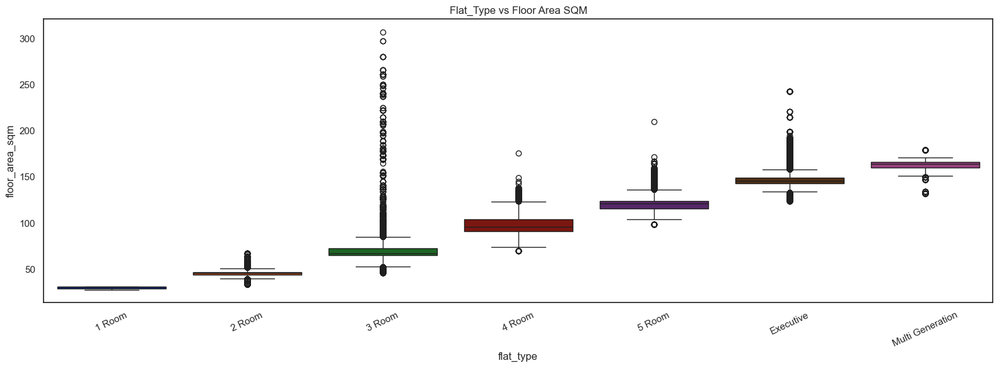

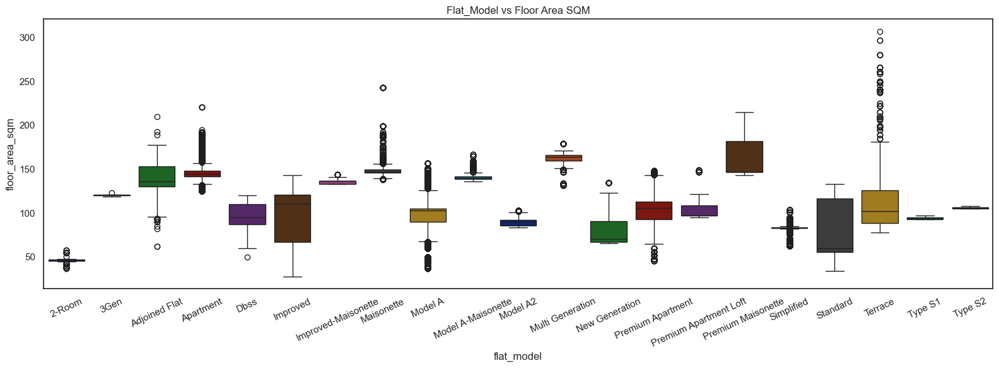

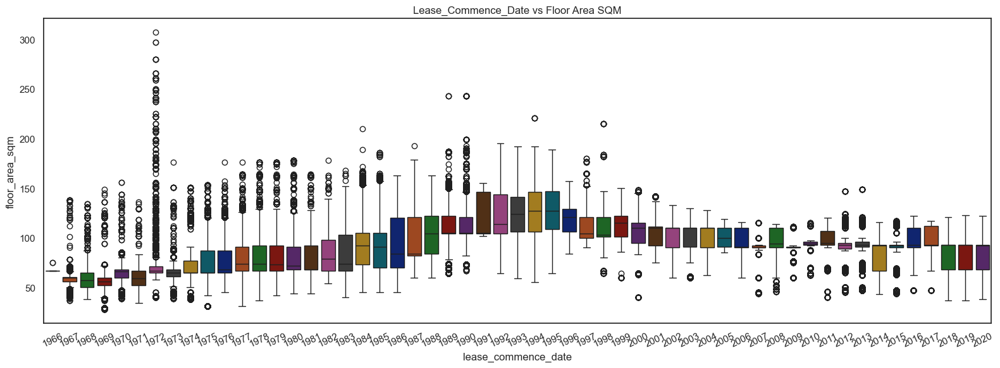

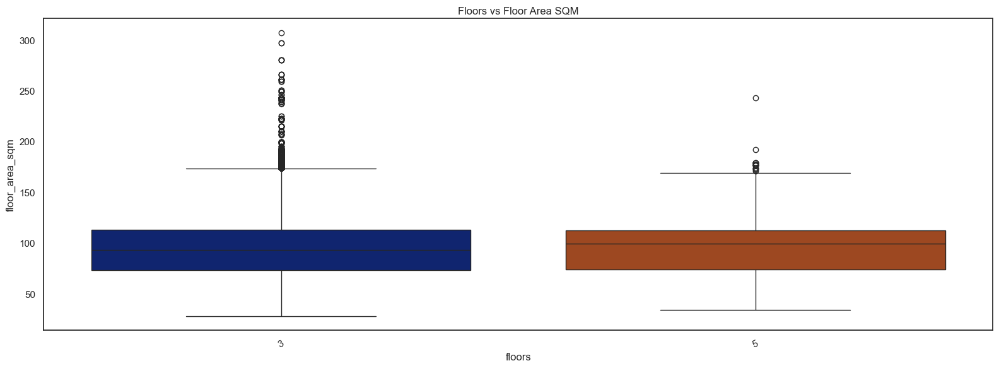

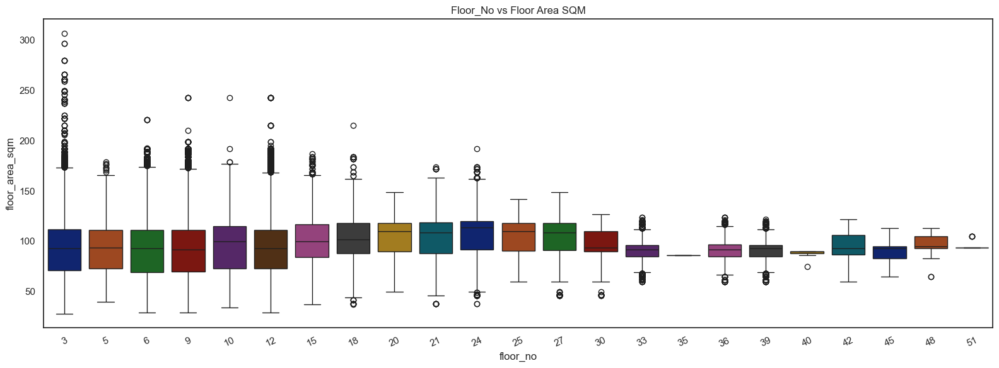

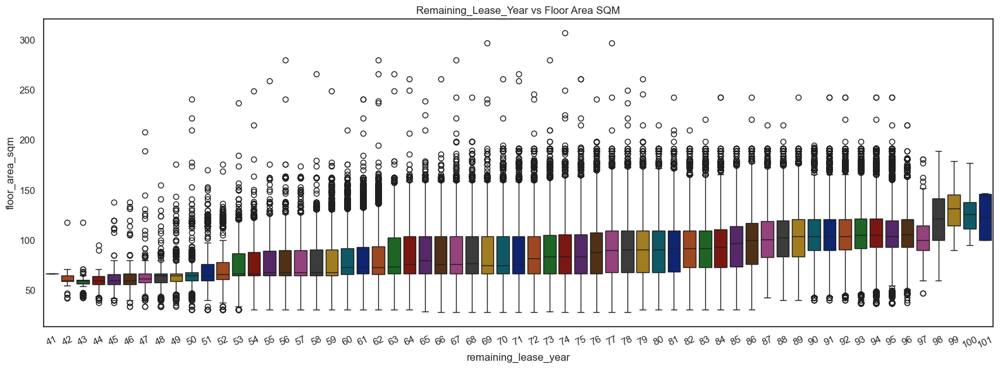

In [12]:
for i in categorical:
    plt.figure(figsize=(16,6))
    sns.boxplot(data=df1,x=i,y="floor_area_sqm",hue=i,palette='dark',legend=False,)
    plt.xticks(rotation=25)
    plt.title(f'{i.title()} vs Floor Area SQM')
    plt.tight_layout()
    plt.show()


<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **We have outliers in all clusters for both Resale Price and Floor area SQM.**</span>

Combine storey range and bedroom to analyse outlier

### <span style="color:Khaki;"> Word Cloud - Checking the frequency in the categorical data

#### <span style="color:Khaki;">Frequency of Flat Type and Flat Model

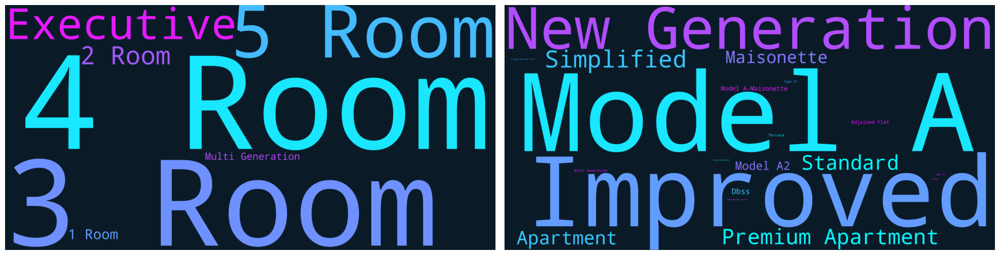

In [13]:
Flat_type = Counter(df1['flat_type'])
Flat_model = Counter(df1['flat_model'])

wordCloud_Flat_type = WordCloud(width= 5000, height = 2500, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_Flat_type.generate_from_frequencies(Flat_type)

# Add this line to create wordCloud_Flat_model
wordCloud_Flat_model = WordCloud(width= 5000, height = 2500, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_Flat_model.generate_from_frequencies(Flat_model)

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(wordCloud_Flat_type, interpolation='bilinear',cmap='Blues')
plt.subplot(1,2,2)
plt.imshow(wordCloud_Flat_model, interpolation='bilinear')
plt.axis('off')
plt.tight_layout()
plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Word cloud also confirms the same - 3 and 4 Rooms in the flat type and Model A, Improved, New Generations has most freqenzy.**</span>

#### <span style="color:Khaki;">Frequency of Town and Floor No

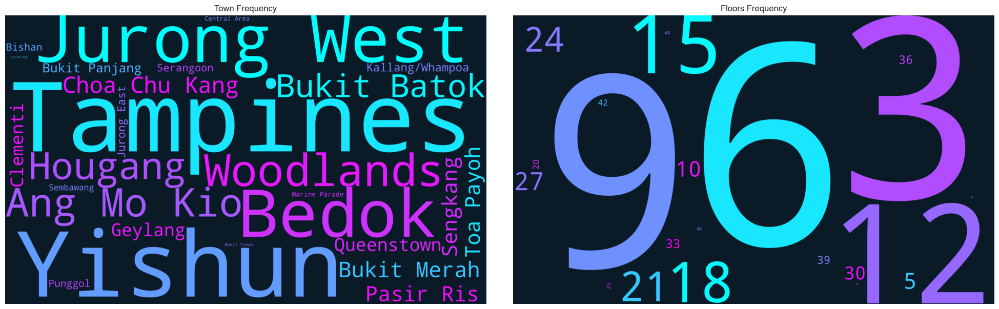

In [14]:
town = Counter(df1['town'])
full_address = Counter(df1['floor_no'].astype('str'))

wordCloud_town = WordCloud(width= 5000, height = 3000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_town.generate_from_frequencies(town)

# Add this line to create wordCloud_Flat_model
wordCloud_full_address = WordCloud(width= 5000, height = 3000, random_state=1, background_color='#0A1B27',
           colormap='cool', collocations=False, stopwords = STOPWORDS)
wordCloud_full_address.generate_from_frequencies(full_address)

plt.figure(figsize=(20,6))
plt.subplot(1,2,1)
plt.axis('off')
plt.imshow(wordCloud_town, interpolation='bilinear',cmap='Blues')
plt.title('Town Frequency')
plt.subplot(1,2,2)
plt.imshow(wordCloud_full_address, interpolation='bilinear')
plt.title('Floors Frequency')
plt.axis('off')
plt.tight_layout()
plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Word cloud also confirms the same as what we observed in the categorical distribution.**</span>

### <span style="color:Khaki;"> Resale Price Analysis</span>
<span Style="color: DodgerBlue;font-size: 130%">&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp; &#9830;</span> <span style="color: white;font-size: 110%">Checking how categorical features are influencing our target feature using statistical test.</span>

In [15]:
def analyze_categorical_relationship(df, continuous_var, categorical_var):
    # Perform one-way ANOVA
    model = ols(f'{continuous_var} ~ C({categorical_var})', data=df).fit()
    anova_table = sm.stats.anova_lm(model, typ=2)
    
    # Calculate eta-squared (effect size)
    ssr = anova_table.loc['C(' + categorical_var + ')', 'sum_sq']
    sst = ssr + anova_table.loc['Residual', 'sum_sq']
    eta_squared = ssr / sst
    
    # Convert eta-squared to percentage
    significance_percentage = eta_squared * 100
    
    # Determine if there's a significant relationship
    p_value = anova_table.loc['C(' + categorical_var + ')', 'PR(>F)']
    alpha = 0.05  # significance level
    is_significant = p_value < alpha
    
    print(f"Relationship between {continuous_var} and {categorical_var}:")
    print(f"ANOVA: F-statistic = {anova_table.loc['C(' + categorical_var + ')', 'F']:.4f}, p-value = {p_value:.4f}")
    print(f"{categorical_var} has {significance_percentage:.2f}% significance with {continuous_var}")
    print(f"There is {'a' if is_significant else 'no'} statistically significant relationship between {categorical_var} and {continuous_var}.")
    print()
    
# Analyze relationships

for cat_var in categorical:
    analyze_categorical_relationship(df1, 'resale_price', cat_var)

Relationship between resale_price and year:
ANOVA: F-statistic = 30875.3446, p-value = 0.0000
year has 53.09% significance with resale_price
There is a statistically significant relationship between year and resale_price.

Relationship between resale_price and month:
ANOVA: F-statistic = 49.4007, p-value = 0.0000
month has 0.06% significance with resale_price
There is a statistically significant relationship between month and resale_price.

Relationship between resale_price and town:
ANOVA: F-statistic = 3585.7858, p-value = 0.0000
town has 9.13% significance with resale_price
There is a statistically significant relationship between town and resale_price.

Relationship between resale_price and flat_type:
ANOVA: F-statistic = 83626.7422, p-value = 0.0000
flat_type has 35.11% significance with resale_price
There is a statistically significant relationship between flat_type and resale_price.

Relationship between resale_price and flat_model:
ANOVA: F-statistic = 16073.8675, p-value = 0.0

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span> <span style="color: Tomato;font-size: 120%"> <b>Year - </b> </span><span style="color: white;font-size: 110%">This feature influencing resale price significantly.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Month - </b> </span><span style="color: white;font-size: 110%">No signs for significance.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830;</span> <span style="color: Tomato;font-size: 120%"> <b>Town - </b> </span><span style="color: white;font-size: 110%">This is also influcing resale price.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Flat Type - </b> </span><span style="color: white;font-size: 110%">This feature influencing resale price significantly.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Flat Model - </b> </span><span style="color: white;font-size: 110%">This feature influencing resale price moderately.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Lease Commence Year - </b> </span><span style="color: white;font-size: 100%">This feature influencing resale price significantly.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span> <span style="color: Tomato;font-size: 120%"> <b>Floors - </b> </span><span style="color: white;font-size: 110%">Since we have less classes in the featuer it will not influence. We get the same result in the stats test.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Floor No - </b> </span><span style="color: white;font-size: 110%">As we seeen above there are less data points in the most of the floors so influences are low.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Remaining Lease Year - </b> </span><span style="color: white;font-size: 110%">Lease commence year shows significant influence where this features shows low. We derived this feature from the lease commence year.</span><br>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Let's compare above statistical results by plotting these categorical features along with resale price.**</span>

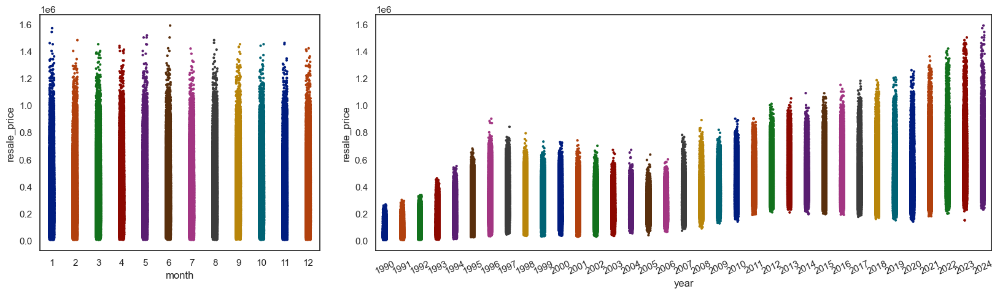

In [16]:
from matplotlib.gridspec import GridSpec
fig=plt.figure(figsize=(20, 5))
gs = GridSpec(1, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
sns.stripplot(data=df1, x="month", y="resale_price", hue="month",palette='dark',s=3, legend=False,ax=ax1)

ax2 = fig.add_subplot(gs[0, 1:])
sns.stripplot(data=df1, x="year", y="resale_price", hue="year",palette='dark',s=3, legend=False,ax=ax2)
plt.xticks(rotation=25)
plt.show()

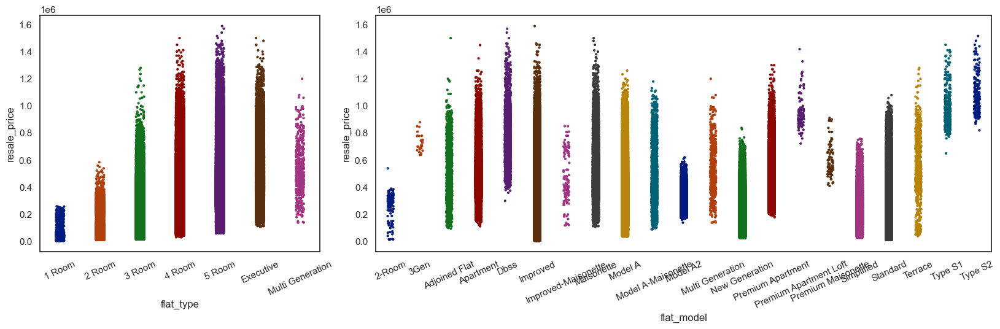

In [17]:
from matplotlib.gridspec import GridSpec
fig=plt.figure(figsize=(20, 5))
gs = GridSpec(1, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
sns.stripplot(data=df1, x="flat_type", y="resale_price", hue="flat_type",palette='dark',s=3, legend=False,ax=ax1)
plt.xticks(rotation=25)

ax2 = fig.add_subplot(gs[0, 1:])
sns.stripplot(data=df1, x="flat_model", y="resale_price", hue="flat_model",palette='dark',s=3, legend=False,ax=ax2)
plt.xticks(rotation=25)
plt.show()

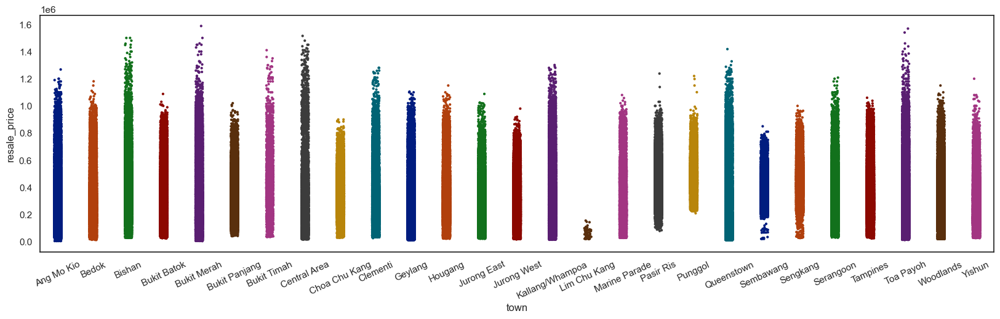

In [18]:
fig=plt.figure(figsize=(20, 5))

sns.stripplot(data=df1, x="town", y="resale_price", hue="town",palette='dark',s=3, legend=False)

plt.xticks(rotation=25)
plt.show()

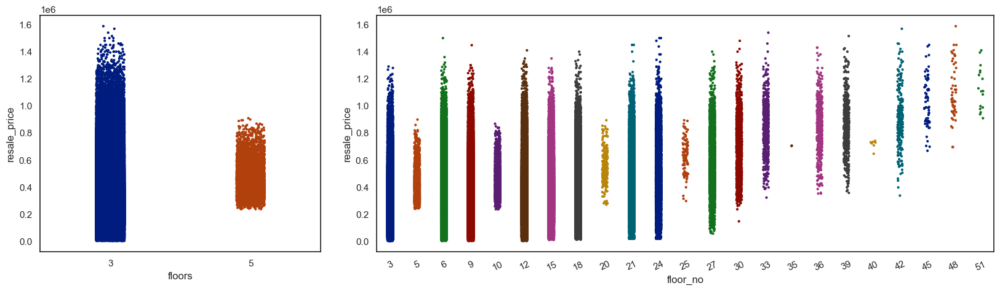

In [19]:
from matplotlib.gridspec import GridSpec
fig=plt.figure(figsize=(20, 5))
gs = GridSpec(1, 3, figure=fig)

ax1 = fig.add_subplot(gs[0, 0])
sns.stripplot(data=df1, x="floors", y="resale_price", hue="floors",palette='dark',s=3, legend=False,ax=ax1)

ax2 = fig.add_subplot(gs[0, 1:])
sns.stripplot(data=df1, x="floor_no", y="resale_price", hue="floor_no",palette='dark',s=3, legend=False,ax=ax2)
plt.xticks(rotation=25)
plt.show()

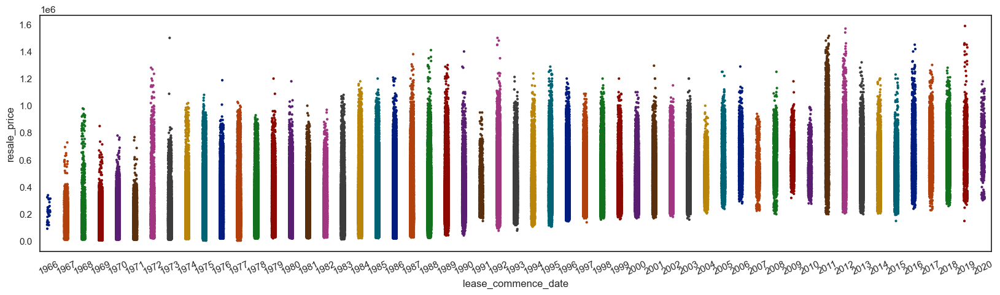

In [20]:
fig=plt.figure(figsize=(20, 5))

sns.stripplot(data=df1, x="lease_commence_date", y="resale_price", hue="lease_commence_date",palette='dark',s=3, legend=False)

plt.xticks(rotation=25)
plt.show()

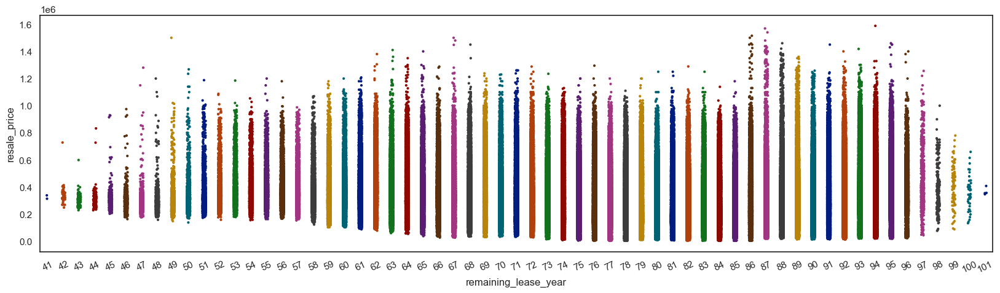

In [21]:
fig=plt.figure(figsize=(20, 5))

sns.stripplot(data=df1, x="remaining_lease_year", y="resale_price", hue="remaining_lease_year",palette='dark',s=3, legend=False)

plt.xticks(rotation=25)
plt.show()

### <span style="color:Khaki;"> Floor Area SQM Analysis </span>

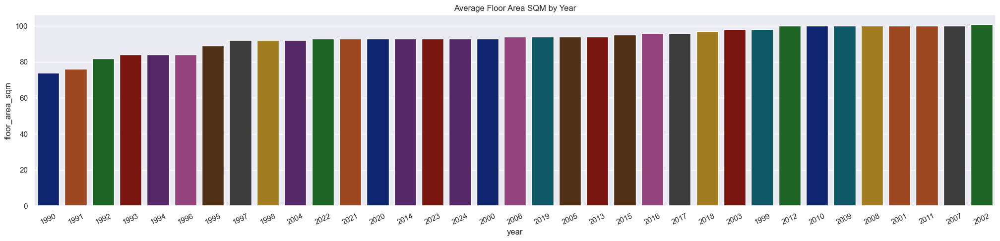

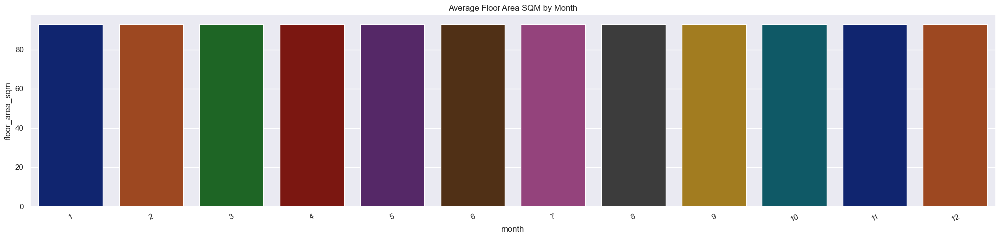

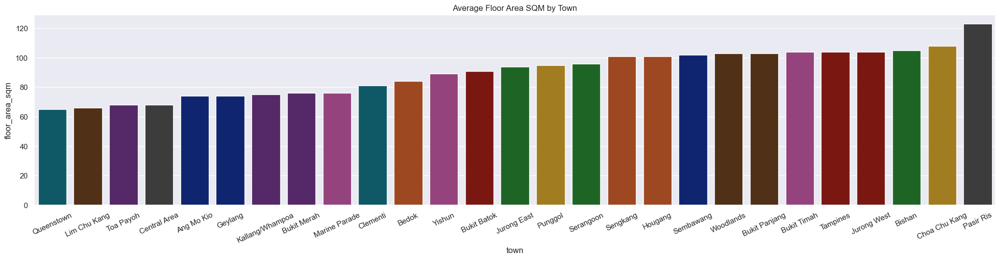

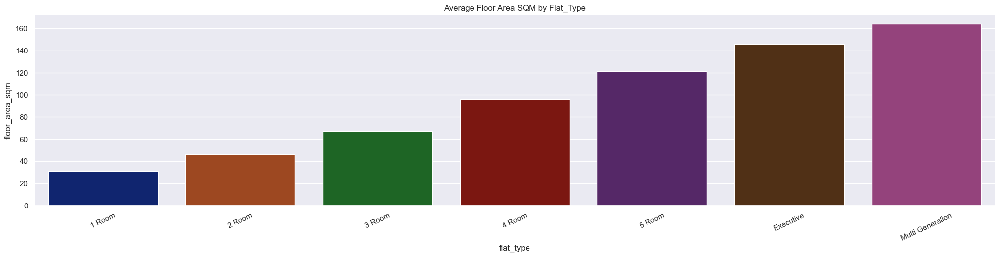

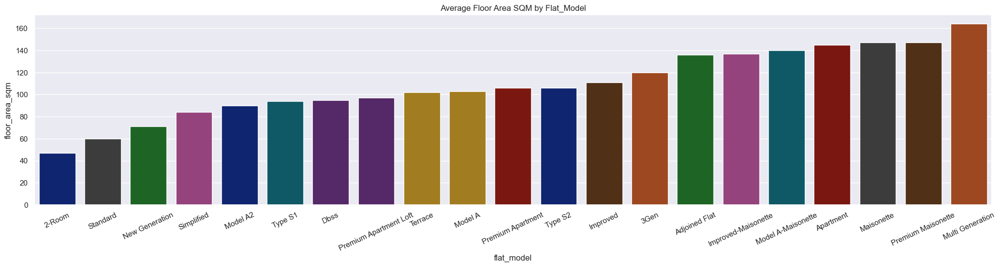

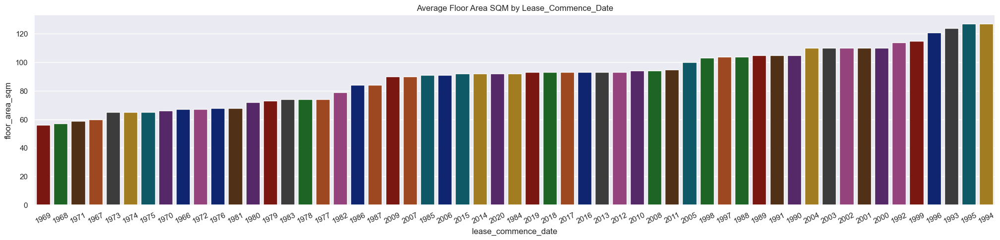

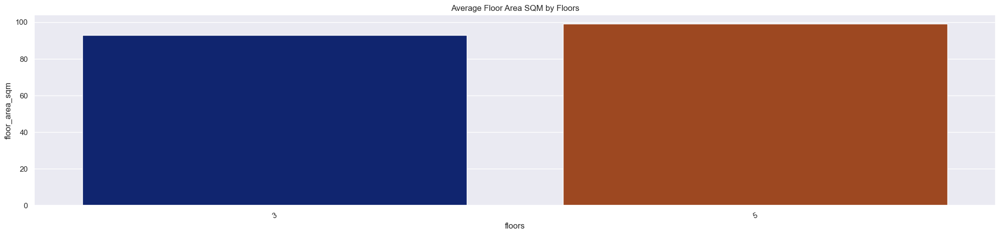

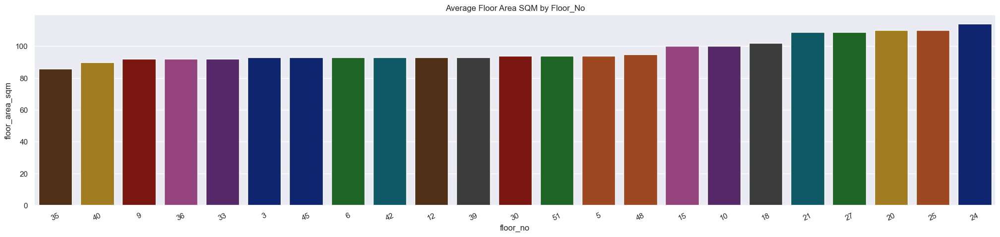

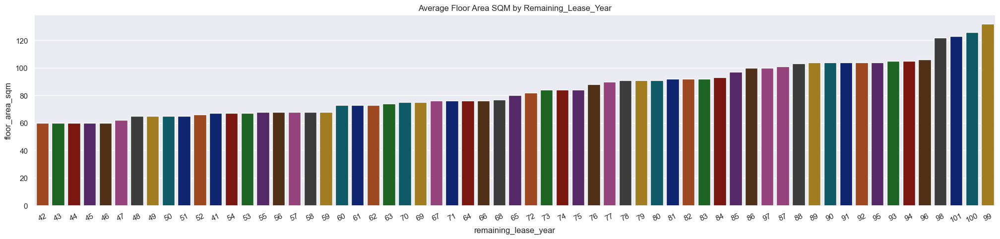

In [22]:
sns.set_theme( font_scale=1)  
# categorical.remove('floor_area_sqm')
for i in categorical:
    plt.figure(figsize=(25, 5))
    data=df1.groupby(i,observed=False)['floor_area_sqm'].median().reset_index().sort_values('floor_area_sqm')
    sns.barplot(data=data, x=data[i], y=data['floor_area_sqm'],hue=i, order =data[i],legend=False,palette='dark',)
    plt.xticks(rotation=25)
    plt.title(f'Average Floor Area SQM by {i.title()}')
    plt.show()
# categorical.append('floor_area_sqm')

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Year - </b> </span><span style="color: white;font-size: 110%">Intially we see a trend, Year increases SQM also increases.After 1998 we see a consistency across all years.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Month - </b> </span><span style="color: white;font-size: 100%">Fairly consistent across all months.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Town - </b> </span><span style="color: white;font-size: 110%">Eventhough we have high data points in the Tampines, Jutong West, Woodlands towns we see different towns which has higher average area SQM. This is a key finding as floor area can be a significant factor influencing resale price.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Flat Type - </b> </span><span style="color: white;font-size: 110%">Obvious result, more preminum more space.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span> <span style="color: Tomato;font-size: 120%"> <b>Flat Model - </b> </span><span style="color: white;font-size: 110%">Same as town despite having high data points other towns are having high average SQM.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830;</span> <span style="color: Tomato;font-size: 120%"> <b></span><span style="color: white;font-size: 110%">No iferences.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830;</span> <span style="color: Tomato;font-size: 120%"> <b>Floors - </b> </span><span style="color: white;font-size: 110%">Obvious result, more floors more space..</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830;</span> <span style="color: Tomato;font-size: 120%"> <b>Floor No - </b> </span><span style="color: white;font-size: 110%">Not applicable.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span></span><span style="color: Tomato;font-size: 120%"> <b>Remaining Lease Year - </b> </span><span style="color: white;font-size: 110%">Not applicable.</span><br>

### <span style="color:Khaki;">Relationship Between Continuous Features and Target</span>

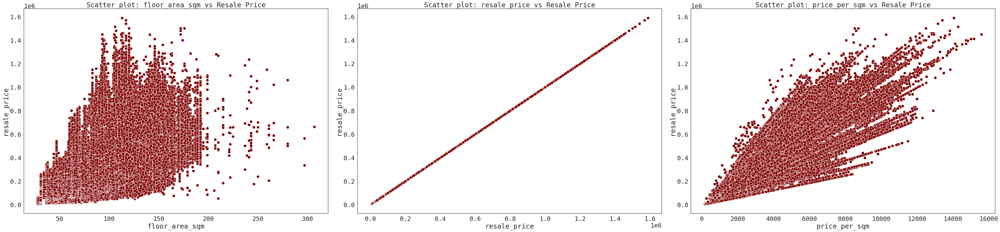

In [23]:
import math
sns.set_theme(context='notebook', style='white', palette='dark', font='DeJaVu Sans Mono', font_scale=2,color_codes=True, rc=None)
total_var=len(continuous)
plot_col=3
plot_row=math.ceil(total_var / 3)

fig, axes = plt.subplots(plot_row, plot_col, figsize=(50, 12))
axes = axes.flatten()
for i, var in  enumerate(continuous):
    sns.scatterplot(data=df1, x=var, y="resale_price", color='maroon',ax=axes[i],s=100)
    axes[i].set_title(f'Scatter plot: {var} vs Resale Price')

for i in range(i + 1, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()
sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1,color_codes=True, rc=None)


<span Style="color: DodgerBlue;font-size: 120%"> &#9830;</span> <span style="color: Tomato;font-size: 100%"> <b>Floor Area SQM - </b> </span> <span style="color: DodgerBlue;font-size: 100%">It slightly started a Linear relationship but scattered across after 50 SQM. It may not be a outliers becaue other features such as Town, year, Flat type, etc can influence the resale price. For instance,50 SQM flat price could be higher than the 300 SQM flats due to it's popularity, amenities, age,Flat Type, floor level and vice versa </span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830;</span> <span style="color: Tomato;font-size: 100%"> <b>No need to worry about resale price and price per sqm as we are not going to feed them in to our model.</b> </span>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Let's plot scatter along with the price influencing features to analyze further.**</span>

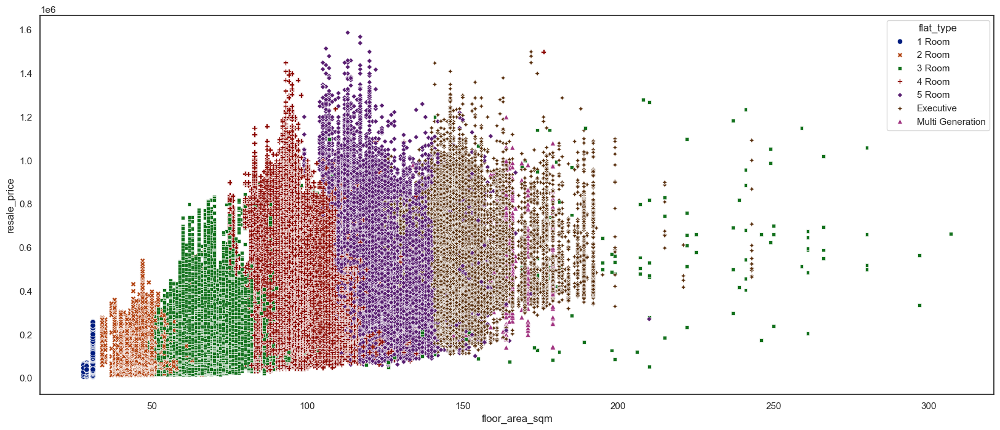

In [24]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=df1, x='floor_area_sqm', y="resale_price", hue='flat_type',style='flat_type',palette='dark')
plt.show()

/home/san/f_drive/Technology/Python Project/Capstone/Singapore-Resale-Flat-Prices-Predicting/singapore/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


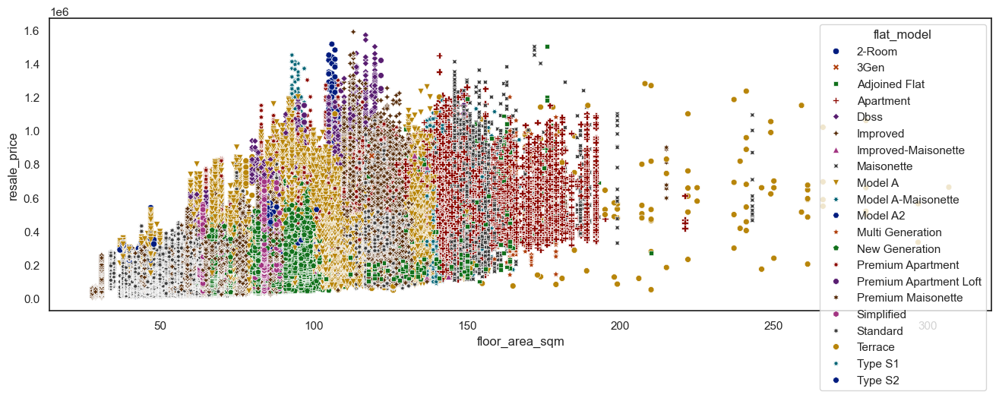

In [25]:
plt.figure(figsize=(16,5))
sns.scatterplot(data=df1, x='floor_area_sqm', y="resale_price", hue='flat_model',style='flat_model',palette='dark')
plt.show()

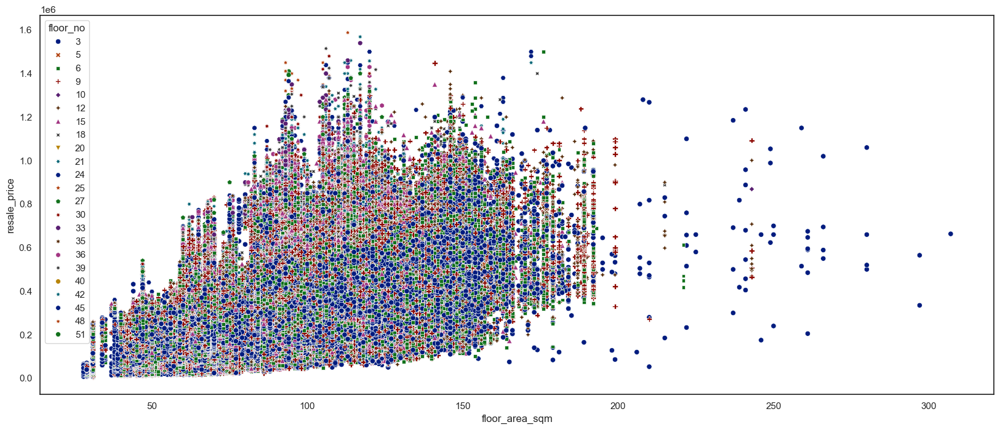

In [26]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=df1, x='floor_area_sqm', y="resale_price", hue='floor_no',style='floor_no',palette='dark')
plt.show()

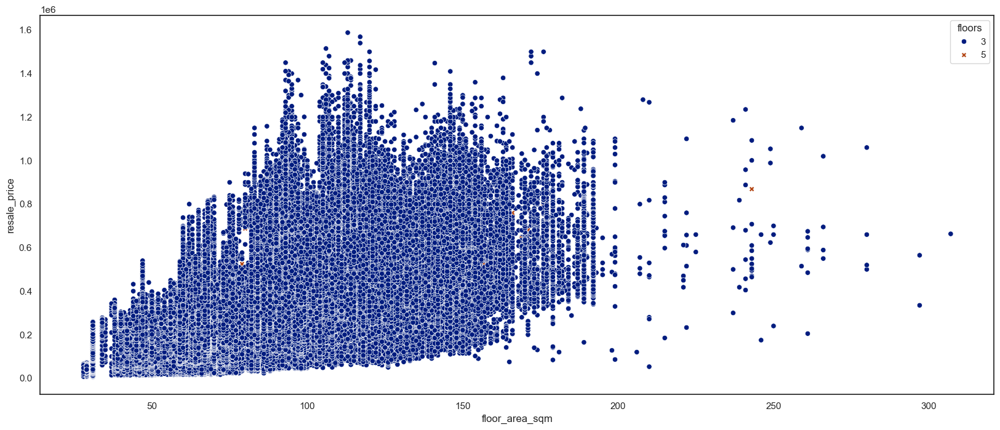

In [27]:
plt.figure(figsize=(20,8))
sns.scatterplot(data=df1, x='floor_area_sqm', y="resale_price", hue='floors',style='floors',palette='dark')
plt.show()

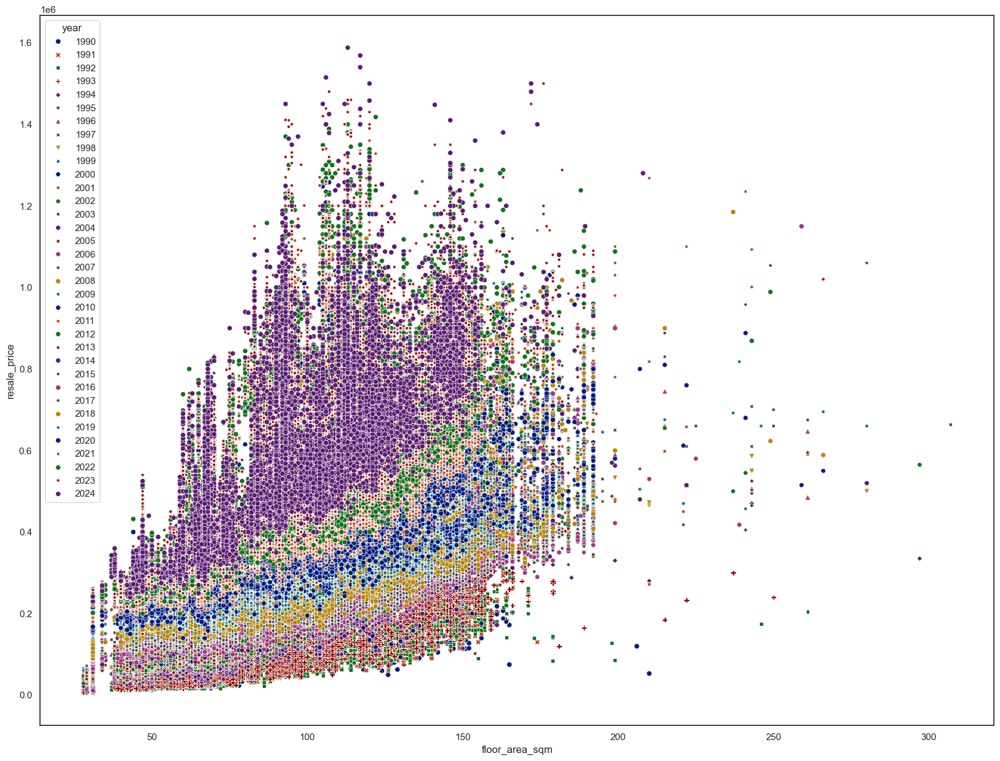

In [29]:
plt.figure(figsize=(20,15))
sns.scatterplot(data=df1, x='floor_area_sqm', y="resale_price", hue='year',style='year',palette='dark')
plt.show()

/home/san/f_drive/Technology/Python Project/Capstone/Singapore-Resale-Flat-Prices-Predicting/singapore/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


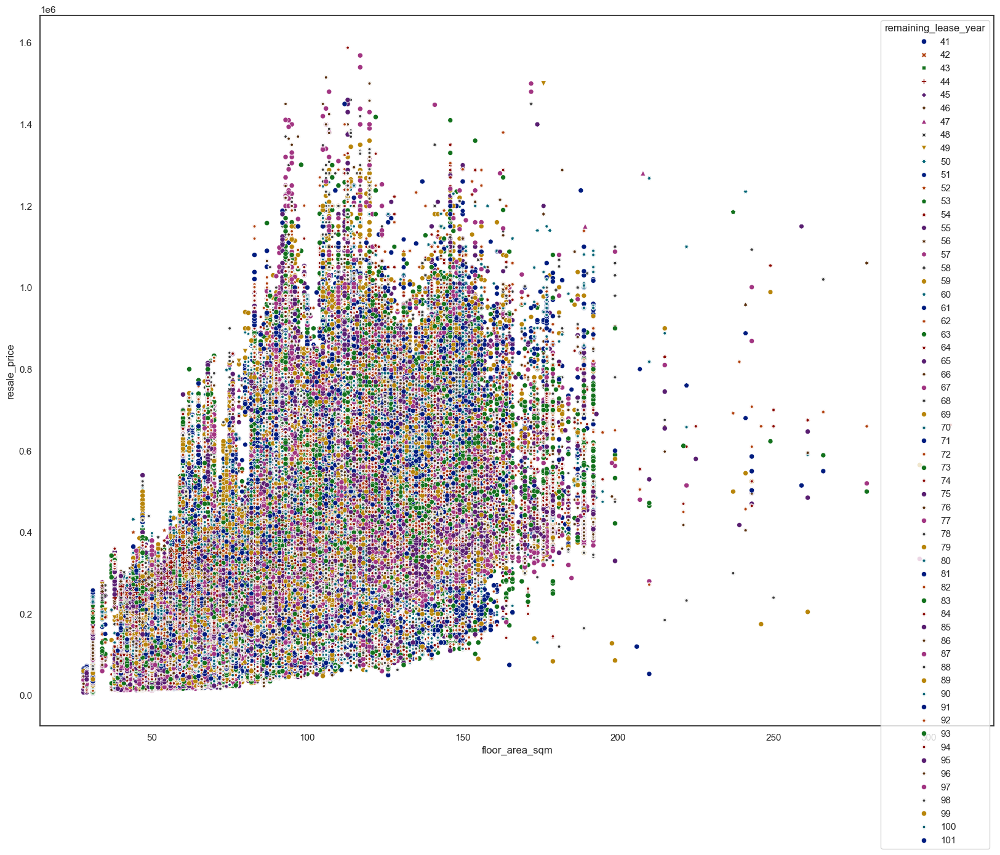

In [30]:
plt.figure(figsize=(20,15))
sns.scatterplot(data=df1, x='floor_area_sqm', y="resale_price", hue='remaining_lease_year',style='remaining_lease_year',palette='dark')
plt.show()

/home/san/f_drive/Technology/Python Project/Capstone/Singapore-Resale-Flat-Prices-Predicting/singapore/lib/python3.10/site-packages/IPython/core/pylabtools.py:170: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  fig.canvas.print_figure(bytes_io, **kw)


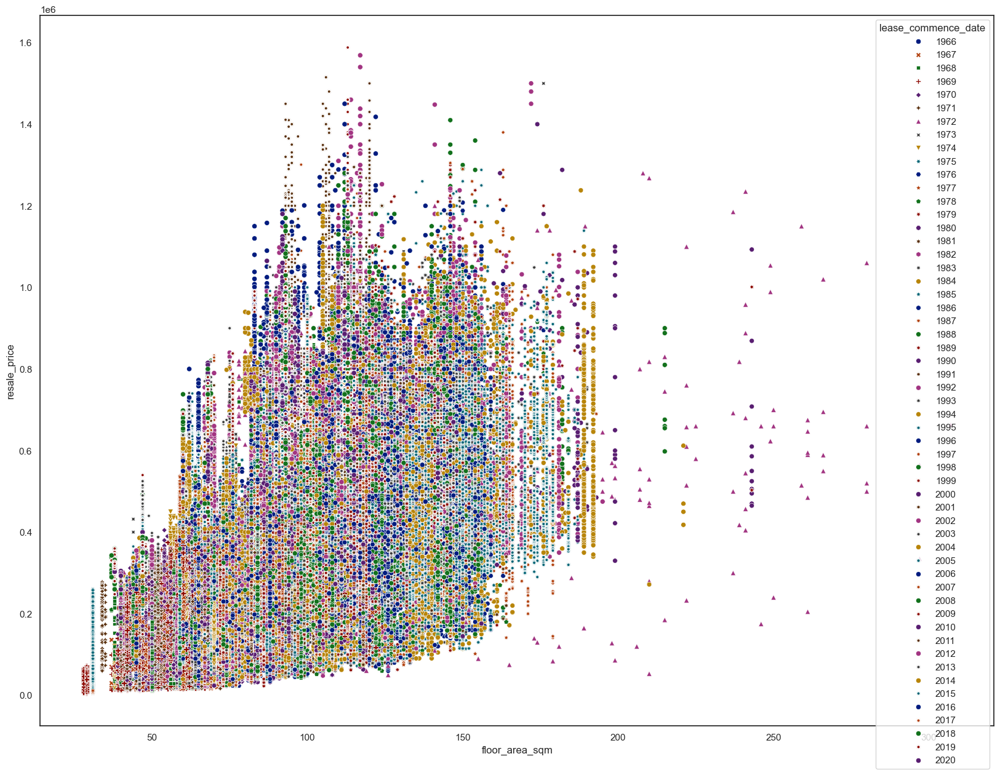

In [31]:
plt.figure(figsize=(20,15))
sns.scatterplot(data=df1, x='floor_area_sqm', y="resale_price", hue='lease_commence_date',style='lease_commence_date',palette='dark')
plt.show()

### <span style="color:Khaki;">Relationship Between Categorical Features and Target</span>

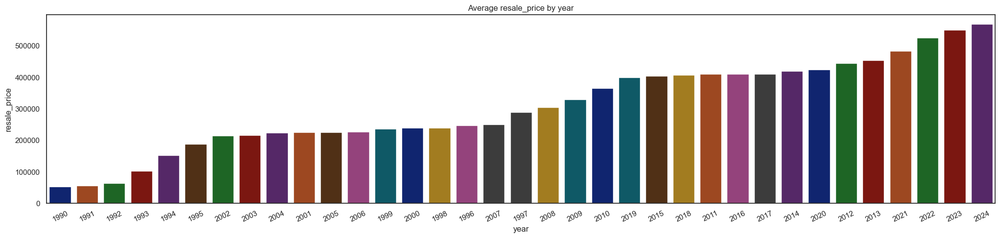

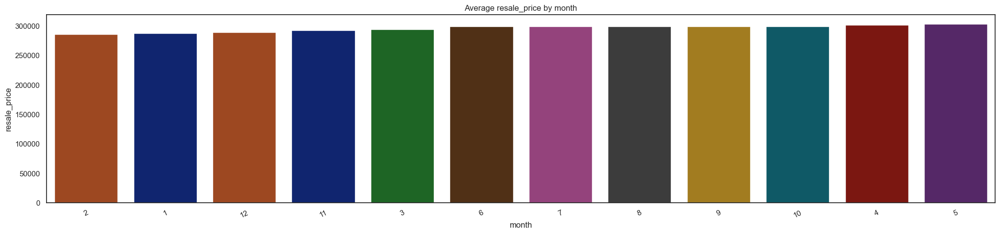

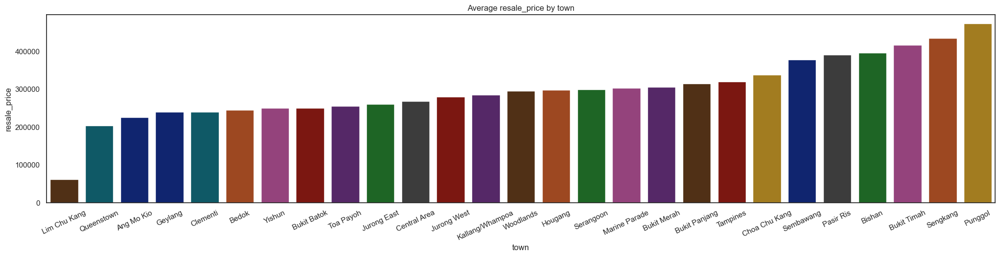

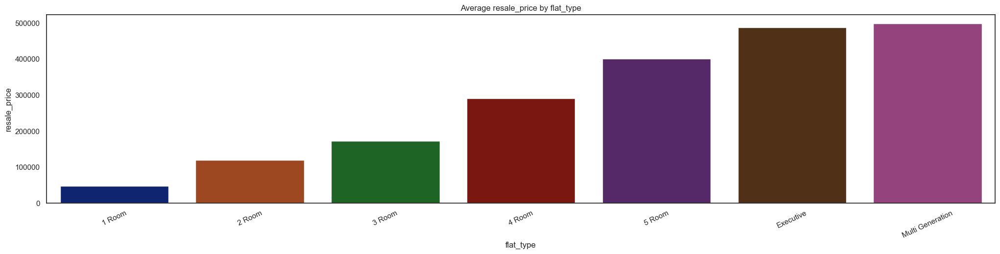

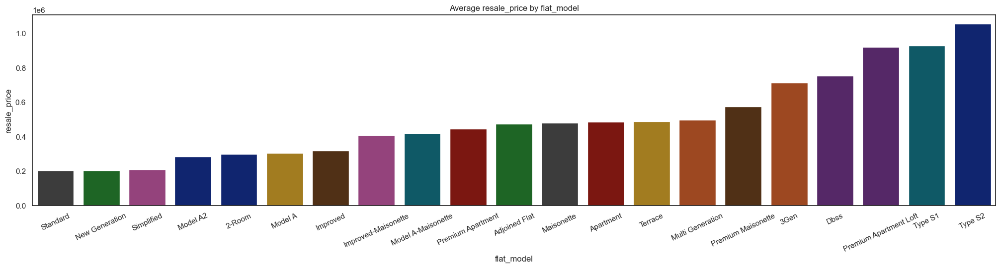

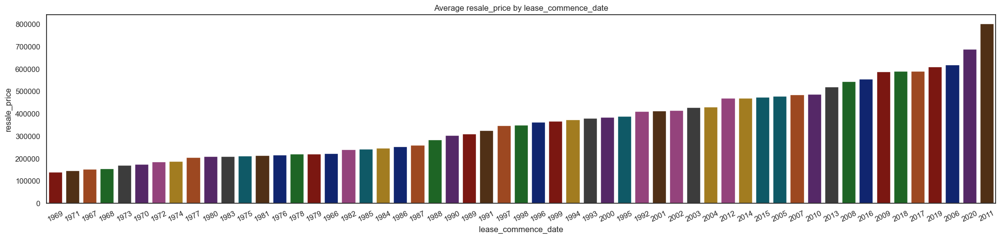

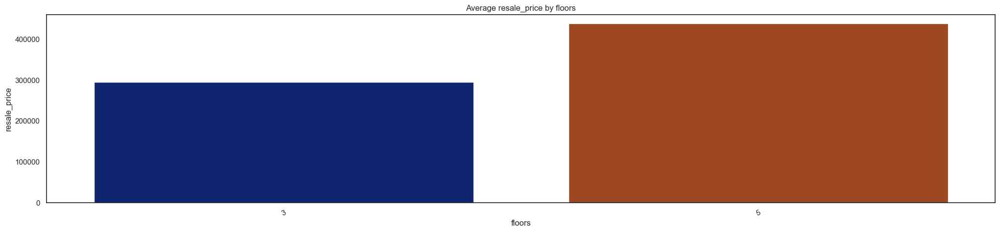

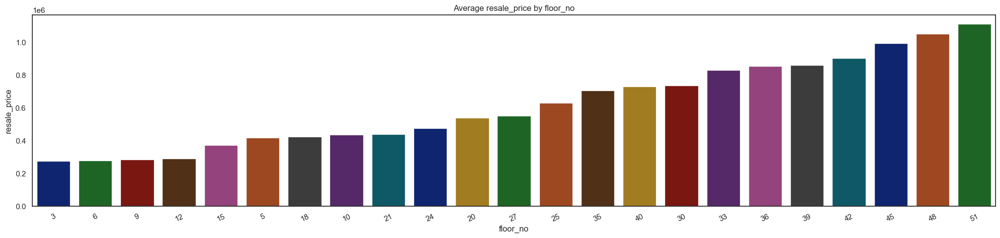

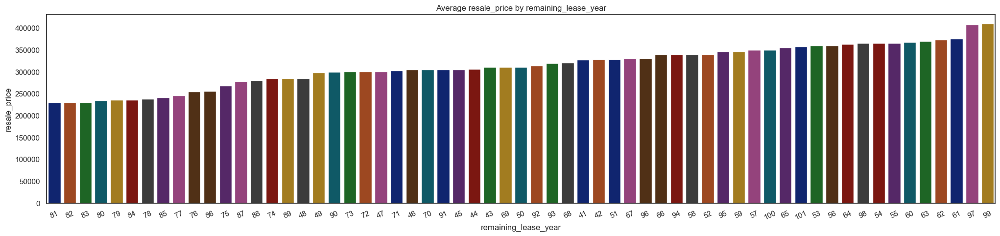

In [32]:
for i in categorical:
    plt.figure(figsize=(25, 5))
    data=df1.groupby(i,observed=False)['resale_price'].median().reset_index().sort_values('resale_price')
    sns.barplot(data=data, x=data[i], y=data['resale_price'],hue=i, order =data[i],legend=False,palette='dark',)
    plt.xticks(rotation=25)
    plt.title(f'Average resale_price by {i}')
    plt.show()

<span Style="color: DodgerBlue;font-size: 130%;"> &#9830; </span> <span style="color: Tomato;font-size: 120%"> <b>Year - </b> </span><span style="color: white;font-size: 110%">The prices seem relatively stable with minor fluctuations till 1995. Post-2000, there are more pronounced fluctuations, indicating potential market volatility or significant economic events influencing prices.</span><br><span Style="color: DodgerBlue;font-size: 130%"> &nbsp;&nbsp;&nbsp;&nbsp; &#9830; </span><span style="color: white;font-size: 110%">The average resale price increases from around 50,000 in 1990 to over 500,000 in 2024.</span>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Month - </b> </span><span style="color: white;font-size: 110%">Fairly consistent across all months. No influences or inferences. We may drop this column.analyze_categorical_relationship</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Town - </b> </span><span style="color: white;font-size: 110%">Eventhough we have high data points in the Tampines, Jutong West, Woodlands towns we see different towns which has higher average price. This is a key finding as town can be a significant factor influencing resale price.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span><span style="color: Tomato;font-size: 120%"> <b>Flat Type - </b> </span><span style="color: white;font-size: 110%">Obvious result, more preminum more price.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span> <span style="color: Tomato;font-size: 120%"> <b>Flat Model - </b> </span><span style="color: white;font-size: 110%">The prices seem relatively fluctuating. Another factor influencing our target variable.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span> <span style="color: Tomato;font-size: 120%"> <b>Lease Commence Year - </b> </span><span style="color: white;font-size: 110%">The prices seem relatively fluctuating. Another factor influencing our target variable.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830;</span> <span style="color: Tomato;font-size: 120%"> <b>Floors - </b> </span><span style="color: white;font-size: 110%">Obvious result, more floors more price.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830;</span> <span style="color: Tomato;font-size: 120%"> <b>Floor No - </b> </span><span style="color: white;font-size: 110%">As we suspected, floor level also influencing out target variable. High level high price with a few fluctuation.</span><br>

<span Style="color: DodgerBlue;font-size: 130%"> &#9830; </span></span><span style="color: Tomato;font-size: 120%"> <b>Remaining Lease Year - </b> </span><span style="color: white;font-size: 110%">Providing same inferences as same as Lease Commence Year. I prefer to use lease commence because there is no observation but more fluctuation. <strong> We got the same level of significance in the statistical test.</strong></span><br>

### <span style="color:Khaki;">Pair Plot</span>

<Figure size 2000x3000 with 0 Axes>

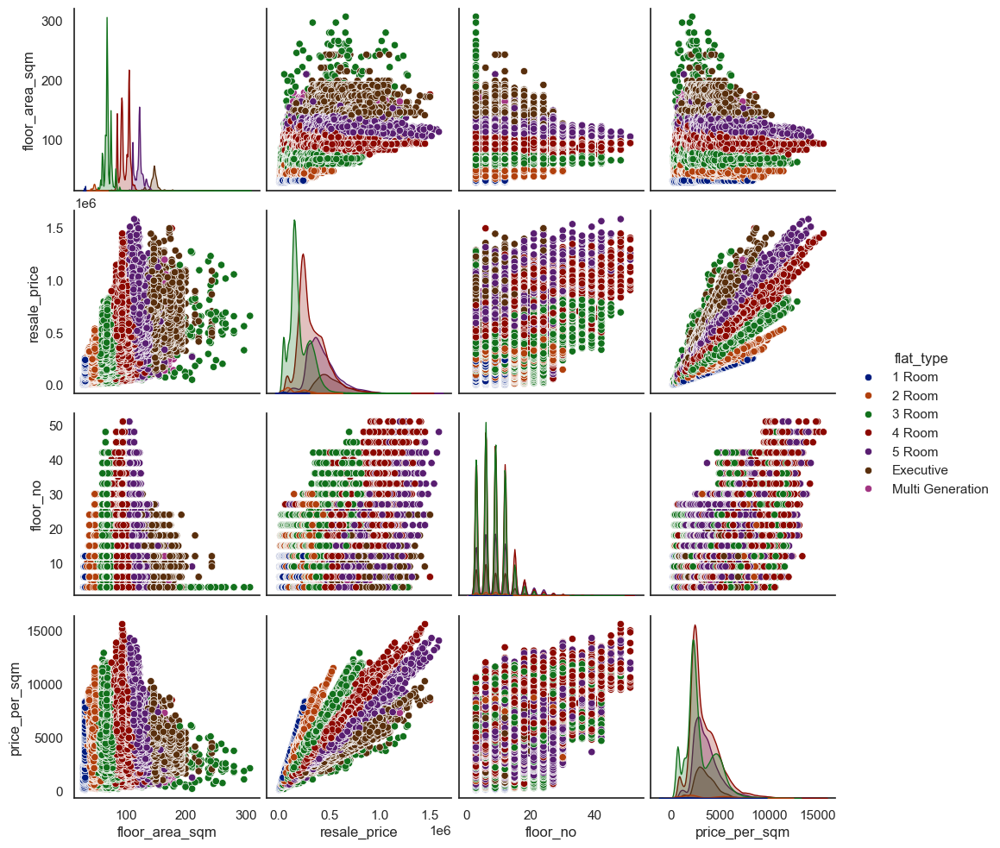

In [47]:
plt.figure(figsize=(20,30))
sns.pairplot(data=df1 , hue = 'flat_type')
plt.show()

### <span style="color:Khaki;">Resale Price by Lease Commence Date and Flat Type </span> 

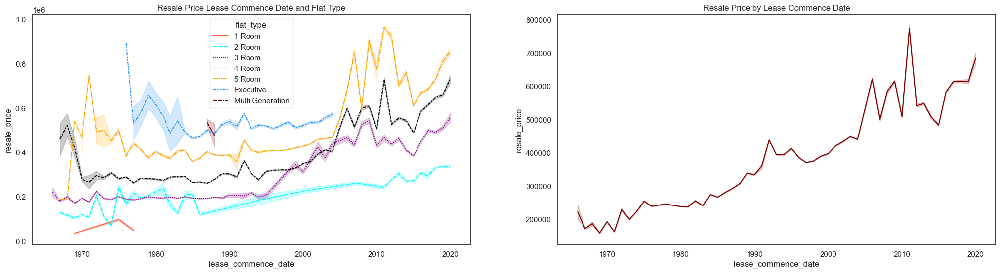

In [33]:
plt.figure(figsize=(25,6))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',hue='flat_type',style="flat_type",palette=['Tomato','aqua','purple','black','Orange','DodgerBlue','maroon'])
plt.title("Resale Price Lease Commence Date and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='lease_commence_date', y = 'resale_price',color='maroon')
plt.title("Resale Price by Lease Commence Date")

plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Line plot also confirms the overall increasing trend with fluctuations.**</span>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Price starts based on the Flat type. Small room from the bottom with increasing trend. This is indicating the price variance in the flat type.**</span>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Also we can observe fewer data points over a period of year. 1 Room starts from 1968 and ends in 1978. Executive flats starts with high price 1975 and ends in 2003. Multi Generation also started high price initially in the 1986 and ends in 1989 in the decreasing trend.**</span>

### <p Style="color: khaki;">Resale Price by Year and Flat Type</p>

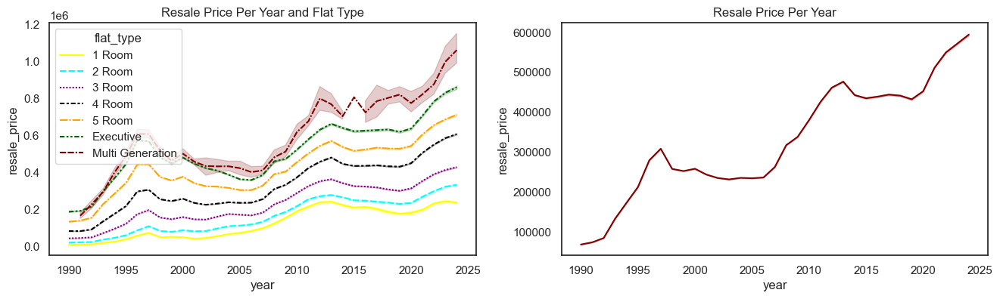

In [34]:
plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='year', y = 'resale_price',hue='flat_type',style="flat_type",palette=['yellow','aqua','purple','black','orange','darkgreen','maroon'])
plt.title("Resale Price Per Year and Flat Type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Irrespective of flat type overall price goes in increasing trend while year increases.**</span>

### <p Style="color: Khaki">Resale Price by no of floors and Flat Type </p>

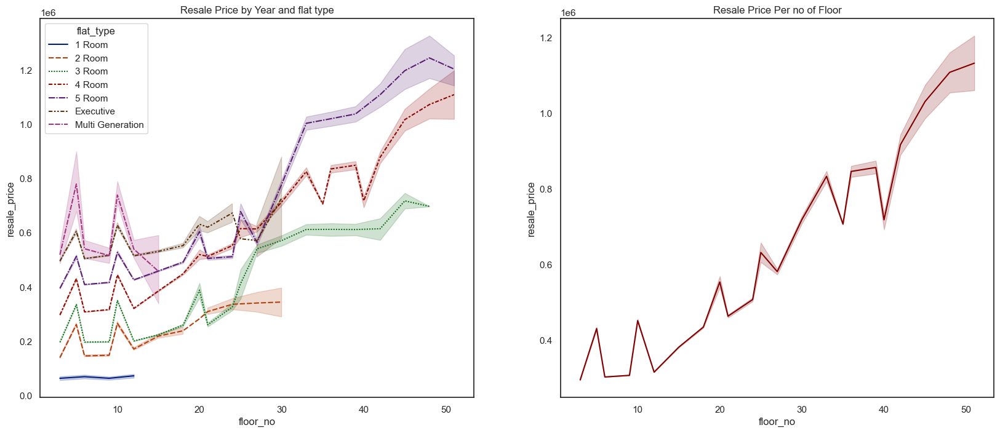

In [50]:
plt.figure(figsize=(20,8))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='floor_no', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and flat type")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='floor_no', y = 'resale_price',color='maroon')
plt.title("Resale Price Per no of Floor")
plt.tight_layout()
plt.show()

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Line plot also confirms the overall increasing trend with fluctuations while floor level increases.**</span>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Price starts based on the floor level. Small low floor starts from the bottom with increasing trend. This is indicating the price variance in the floor level.**</span>

<span style="color: Chartreuse;font-size:150%">   &#9784; </span> <span style="color: Tomato;font-size: 120%;background-color:"> **Premium flats floor level is above 40. Other flats are below floor level 40.**</span>

### <p Style="color: Khaki">Resale Price by remaining_lease_year and Flat Type

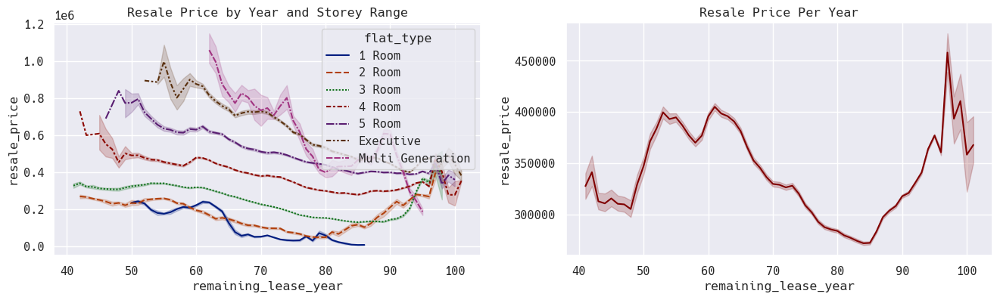

In [36]:
sns.set_theme( font_scale=1,font='Hack Nerd Font')

plt.figure(figsize=(16,4))

plt.subplot(1,2,1)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',hue='flat_type',style="flat_type",palette='dark')
plt.title("Resale Price by Year and Storey Range")

plt.subplot(1,2,2)
sns.lineplot(data = df1, x ='remaining_lease_year', y = 'resale_price',color='maroon')
plt.title("Resale Price Per Year")

plt.show()

### <p Style="color: Khaki">Correlation - Pearson's and Spearman's </p>

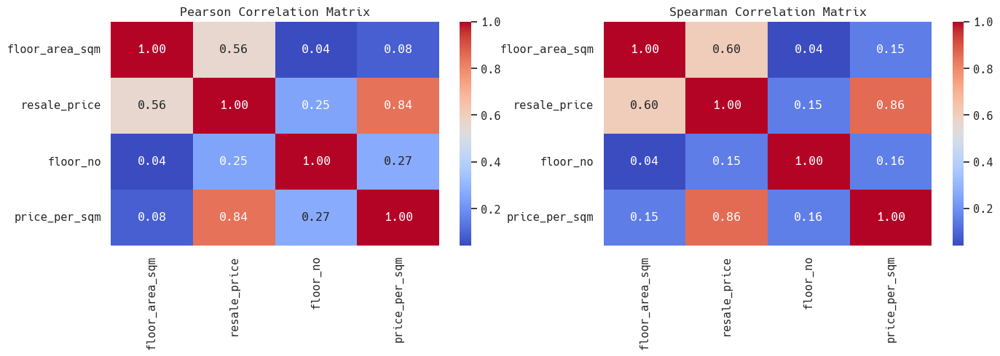

In [39]:
cor_col = df1.select_dtypes(include='number')
correlation_matrix_pear = cor_col.corr()
plt.figure(figsize=(16,4))
plt.subplot(1,2,1)
sns.heatmap(correlation_matrix_pear,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Pearson Correlation Matrix')


cor_col = df1.select_dtypes(include='number')
correlation_matrix = cor_col.corr(method='spearman')
plt.subplot(1,2,2)
sns.heatmap(correlation_matrix,annot=True,fmt='.2f',cmap='coolwarm')
plt.title('Spearman Correlation Matrix')
plt.show()

### <p Style="color: Khaki">Experimenting with a few types of data transformation techniques to see which one suits best.

In [40]:
skew_dict=dict(df1[continuous].skew())
skew_dict

{'floor_area_sqm': 0.3660726547241211, 'resale_price': 0.942163539645637}

In [41]:
def boxcox_transform(x):
    # Perform Box-Cox transformation
    transformed_data,lmbda = boxcox(x)
    return transformed_data,lmbda

In [42]:
method_functions =  {
    'log': np.log,
    'square': np.sqrt,
    'rec': lambda x: 1 / x,
    'sig': lambda x: 1 / (1 + np.exp(-x)),
    'pow': lambda x: np.power(x, 2),
    'exp':lambda x: x**(1/5),
    'boxcox': boxcox_transform,
        }

def skewness_checker(df, column, method):
    normalized_df=pd.DataFrame()

    for method_name, func in method_functions.items():
        for col in column:

            new_column = f'{col}_{method_name}'
            if method_name in ['boxcox']:
                transformed_values = func(df[col])[0]
            else:
                transformed_values = func(df[col])
            normalized_df[new_column] = transformed_values

    return normalized_df

In [43]:
normalized_df=skewness_checker(df1, continuous, method_functions)
normalized_df

,floor_area_sqm_log,resale_price_log,floor_area_sqm_square,resale_price_square,floor_area_sqm_rec,resale_price_rec,floor_area_sqm_sig,resale_price_sig,floor_area_sqm_pow,resale_price_pow,floor_area_sqm_exp,resale_price_exp,floor_area_sqm_boxcox,resale_price_boxcox
0,3.433987,9.104980,5.567764,94.868330,0.032258,0.000111,1.0,1.0,961.0,8.100000e+07,1.987341,6.178009,6.593803,121.361716
1,3.433987,8.699515,5.567764,77.459667,0.032258,0.000167,1.0,1.0,961.0,3.600000e+07,1.987341,5.696791,6.593803,101.219209
2,3.433987,8.987197,5.567764,89.442719,0.032258,0.000125,1.0,1.0,961.0,6.400000e+07,1.987341,6.034176,6.593803,115.137050
3,3.433987,8.699515,5.567764,77.459667,0.032258,0.000167,1.0,1.0,961.0,3.600000e+07,1.987341,5.696791,6.593803,101.219209
4,4.290460,10.762149,8.544003,217.255610,0.013699,0.000021,1.0,1.0,5329.0,2.227840e+09,2.358656,8.605744,9.865798,253.461991
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
181257,4.718499,13.511699,10.583005,859.069264,0.008929,0.000001,1.0,1.0,12544.0,5.446440e+11,2.569470,14.914588,11.902491,851.806525
181258,4.804021,13.429848,11.045361,824.621125,0.008197,0.000001,1.0,1.0,14884.0,4.624000e+11,2.613798,14.672421,12.346850,821.690977
181259,4.983607,13.579788,12.083046,888.819442,0.006849,0.000001,1.0,1.0,21316.0,6.241000e+11,2.709384,15.119082,13.323874,877.695601
181260,4.983607,13.815511,12.083046,1000.000000,0.006849,0.000001,1.0,1.0,21316.0,1.000000e+12,2.709384,15.848932,13.323874,973.536281


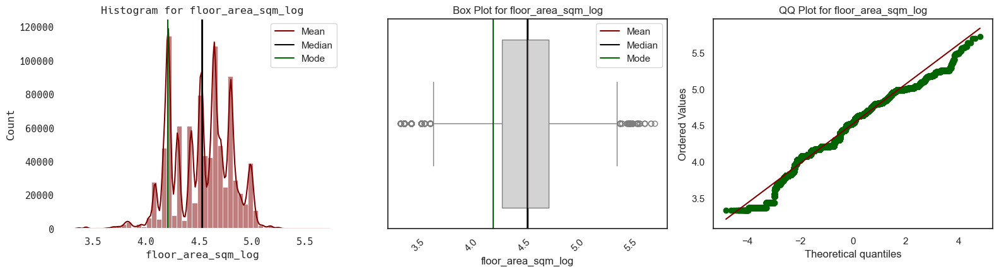



Skew for floor_area_sqm_log is -0.23

Kurtosis for floor_area_sqm_log is -0.36




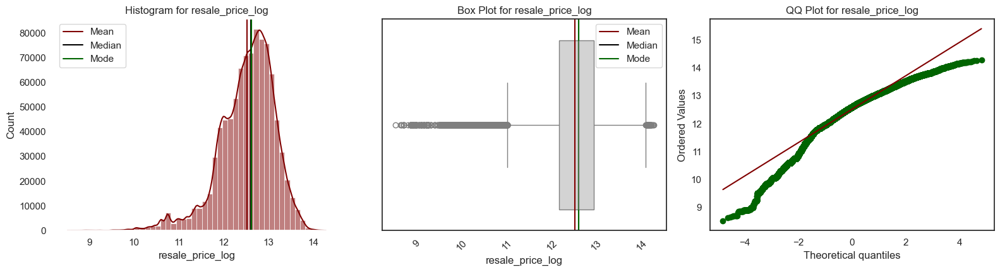



Skew for resale_price_log is -0.92

Kurtosis for resale_price_log is 1.61




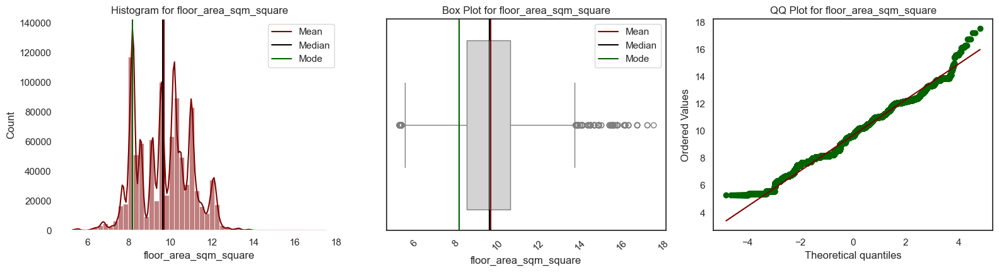



Skew for floor_area_sqm_square is 0.08

Kurtosis for floor_area_sqm_square is -0.57




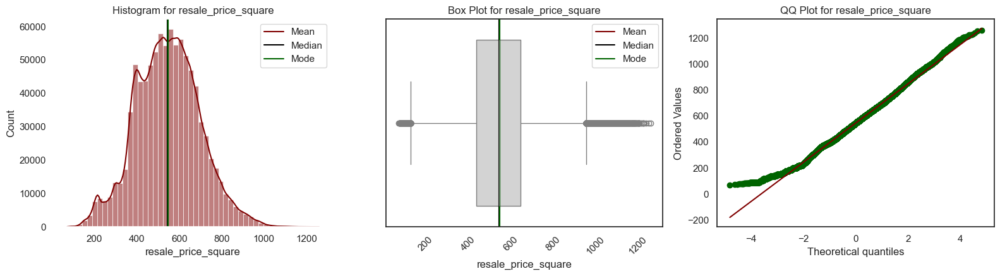



Skew for resale_price_square is 0.11

Kurtosis for resale_price_square is 0.05




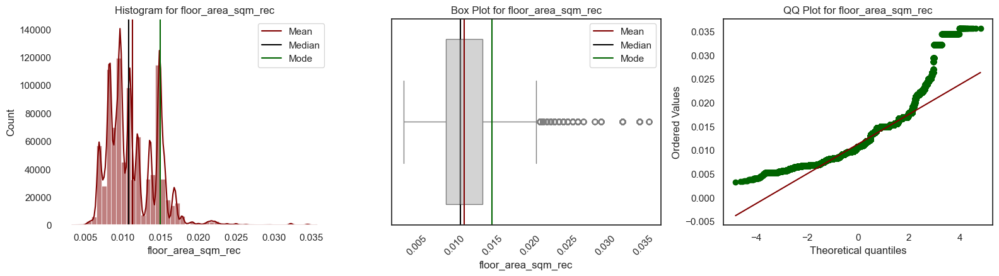



Skew for floor_area_sqm_rec is 1.10

Kurtosis for floor_area_sqm_rec is 3.00




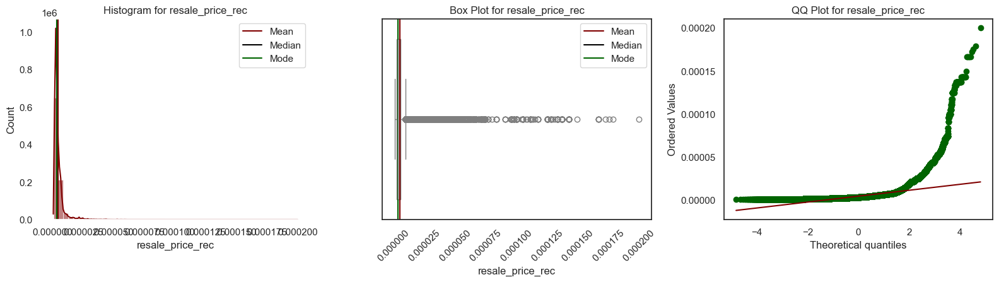



Skew for resale_price_rec is 7.24

Kurtosis for resale_price_rec is 112.40




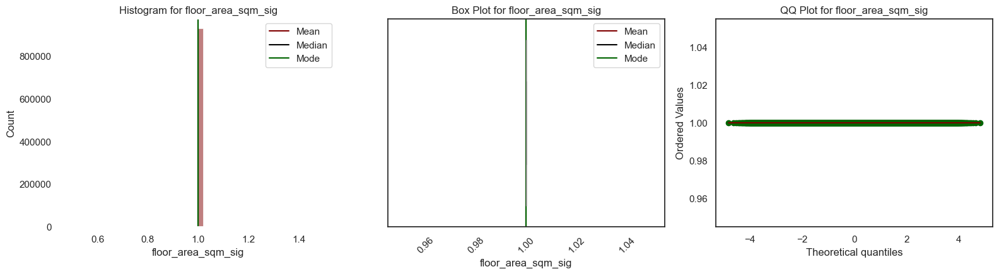



Skew for floor_area_sqm_sig is 0.00

Kurtosis for floor_area_sqm_sig is 0.00




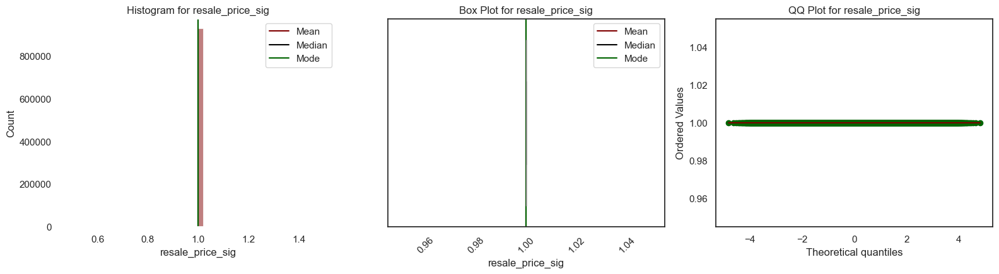



Skew for resale_price_sig is 0.00

Kurtosis for resale_price_sig is 0.00




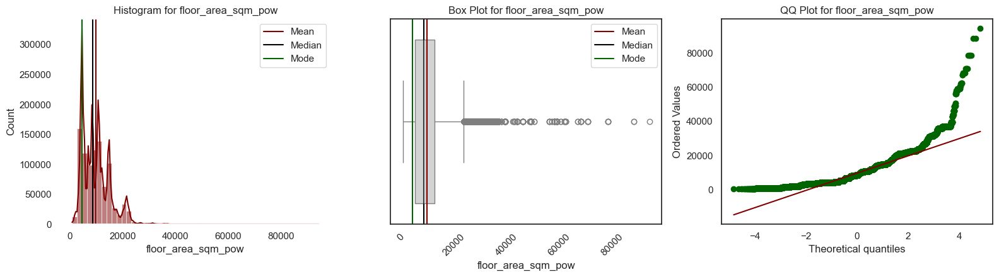



Skew for floor_area_sqm_pow is 1.00

Kurtosis for floor_area_sqm_pow is 1.66




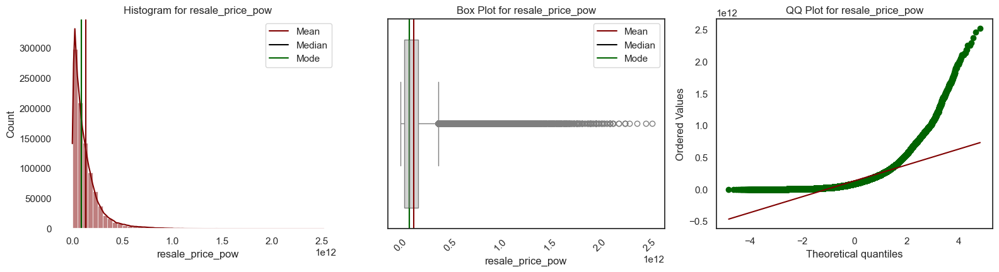



Skew for resale_price_pow is 2.81

Kurtosis for resale_price_pow is 13.23




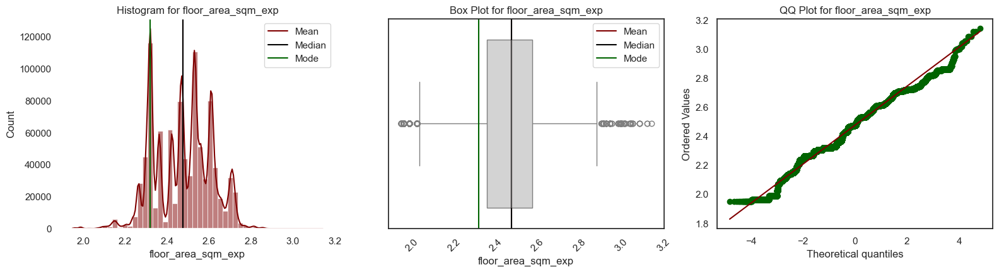



Skew for floor_area_sqm_exp is -0.11

Kurtosis for floor_area_sqm_exp is -0.50




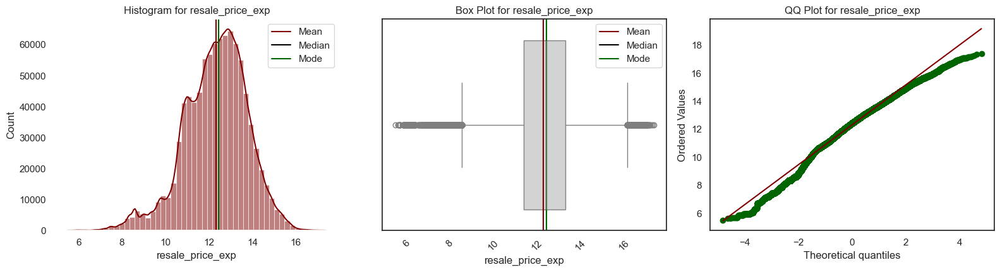



Skew for resale_price_exp is -0.46

Kurtosis for resale_price_exp is 0.48




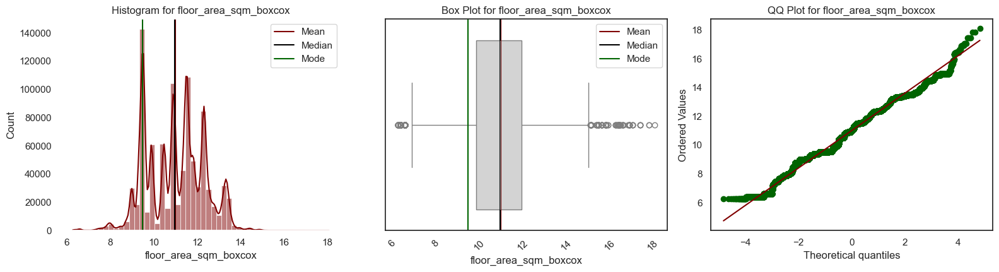



Skew for floor_area_sqm_boxcox is -0.02

Kurtosis for floor_area_sqm_boxcox is -0.55




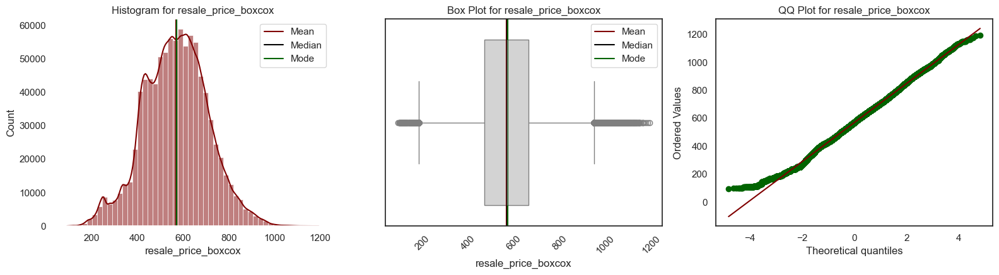



Skew for resale_price_boxcox is -0.00

Kurtosis for resale_price_boxcox is 0.05


Skewness:
 {'floor_area_sqm_log': -0.23334388, 'resale_price_log': -0.9240431018462136, 'floor_area_sqm_square': 0.07508402, 'resale_price_square': 0.10918464819090822, 'floor_area_sqm_rec': 1.1036736, 'resale_price_rec': 7.24332894254145, 'floor_area_sqm_sig': 0.0, 'resale_price_sig': 0.0, 'floor_area_sqm_pow': 1.0026332, 'resale_price_pow': 2.810519042318628, 'floor_area_sqm_exp': -0.10569635, 'resale_price_exp': -0.4641821320745675, 'floor_area_sqm_boxcox': -0.016471082, 'resale_price_boxcox': -0.0005540558944127643} 

 Kurtois:
 {'floor_area_sqm_log': -0.35770032, 'resale_price_log': 1.6050165886358765, 'floor_area_sqm_square': -0.56573135, 'resale_price_square': 0.04932580507928508, 'floor_area_sqm_rec': 3.003057, 'resale_price_rec': 112.3990151551124, 'floor_area_sqm_sig': 0.0, 'resale_price_sig': 0.0, 'floor_area_sqm_pow': 1.6554761, 'resale_price_pow': 13.227158328215623, 'floor_area_sqm_exp': -

In [44]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df.columns:
    univar_num(normalized_df,i)
    skews=normalized_df[i].skew()
    kurt=normalized_df[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)

In [45]:
df1[df1.storey_range]

AttributeError: 'DataFrame' object has no attribute 'storey_range'

## Handling Outliers

### Function to handle outliers based on categorical variables

In [ ]:
def handle_outliers(df, continuous_var, categorical_vars, iqr_multiplier=1.5):
    df_copy = df.copy()
    outlier_count = 0
    
    # Group by all categorical variables at once
    grouped = df_copy.groupby(categorical_vars,observed=True)
    
    def replace_outliers(group):
        nonlocal outlier_count
        Q1 = group[continuous_var].quantile(0.25)
        Q3 = group[continuous_var].quantile(0.75)
        IQR = Q3 - Q1
        lower_bound = Q1 - iqr_multiplier * IQR
        upper_bound = Q3 + iqr_multiplier * IQR
        
        # Count outliers
        outliers = (group[continuous_var] < lower_bound) | (group[continuous_var] > upper_bound)
        outlier_count += outliers.sum()
        
        # Cap outliers instead of replacing with median
        group.loc[group[continuous_var] < lower_bound, continuous_var] = lower_bound
        group.loc[group[continuous_var] > upper_bound, continuous_var] = upper_bound
        
        return group[continuous_var]

    # Apply the function and update only the continuous variable
    df_copy[continuous_var] = grouped[continuous_var].transform(replace_outliers)
    
    print(f"Total outliers handled: {outlier_count}")
    return df_copy

### List of categorical variables that influence resale_price

In [ ]:
categorical_vars = ['year','flat_type','town']

### Apply the function to handle outliers

In [ ]:
df1.columns

In [ ]:
df1['full_address'] = df1['full_address'].astype('category')
df1['floor_area_sqm'] = pd.to_numeric(df1['floor_area_sqm'], errors='coerce')
df1['floor_area_sqm'] = df1['floor_area_sqm'].astype('float')
df1.info()

In [ ]:
df1

In [ ]:
grouped = df1.groupby(categorical_vars,observed=True)
# print(list(grouped))

In [ ]:
# df1_cleaned = handle_outliers(df1, 'resale_price', categorical_vars)
# df1_cleaned = handle_outliers(df1, 'floor_area_sqm', categorical_vars)
df1_cleaned = handle_outliers(df1, 'resale_price', categorical_vars)

## Exploratory Data Analysis. After Handling Skewness and Outliers

In [ ]:
df1_cleaned.describe().T

In [ ]:
color_good = '\033[32m'  # Dark Green for good skew
color_okay = '\033[92m'  # Light Green for okay skew
color_bad = '\033[91m'  # Maroon for bad skew
color_neutral = '\033[0m'  # Reset color

skewed_col = []

sns.set_theme(context='notebook', style='white', palette='dark', font='sans-serif', font_scale=1, color_codes=True, rc=None)  

for i in continuous:
    univar_num(df1_cleaned,i) 
    skew_val = df1_cleaned[i].skew()
    
    if -0.5 <= skew_val <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skew_val <= 0.5 or -0.5 < skew_val < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
        skewed_col.append(i)

    print(f"\n{color}Skew for {i} is {skew_val:.2f}{color_neutral}\n")

In [ ]:
normalized_df_cleaned=skewness_checker(df1_cleaned, continuous, method_functions)
normalized_df_cleaned

In [ ]:
transformed_skewness = {}
transformed_kurtosis = {}
for i in normalized_df_cleaned.columns:
    univar_num(normalized_df_cleaned,i)
    skews=normalized_df_cleaned[i].skew()
    kurt=normalized_df_cleaned[i].kurtosis()
    transformed_skewness.update({i:skews})
    transformed_kurtosis.update({i:kurt})
    color = color_neutral
    if -0.5 <= skews <= 0.5:
        color = color_good  # Dark Green for near-zero skew
    elif 0 < skews <= 0.5 or -0.5 < skews < 0:
        color = color_okay  # Light Green for slightly positive or slightly negative skew
    else:  # skew_val > 0.5 or skew_val < -0.5
        color = color_bad  # Maroon for significant skew
      
    print(f"\n\n{color}Skew for {i} is {skews:.2f}{color_neutral}")    
    print(f"\n{color}Kurtosis for {i} is {kurt:.2f}{color_neutral}\n\n")
print( 'Skewness:\n',transformed_skewness,'\n\n','Kurtois:\n',transformed_kurtosis)

In [ ]:
df1.sample(5)

In [ ]:
df1.sample(5)